
# Анализ программы лояльности в ритейле

## Задачи проекта

Необходимо проанализировать программу лояльности магазина:
* Провести исследовательский анализ данных;
* Провести анализ программы лояльности;
* Сформулировать и проверить статистические гипотезы.

## Декомпозиция проекта

![Общая схема](https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1lTs_mRCFa4t30JWASbYbv8sNgfBAwX3V)

![Предобработка данных](https://drive.google.com/uc?export=download&confirm=no_antivirus&id=16nRHqXcakyZNbP_hjF8a6lys30vwkJv1)

![Исследовательский анализ](https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1MjIkNiZNeyPlxFT-5pwKe-qBCh04Hp8I)

![Статистический анализ данных](https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1BakasVrD9s1P5q8pRT0AzLn1o4sUGh1Q)

![Кластеризация](https://drive.google.com/uc?export=download&confirm=no_antivirus&id=1Lu9MQ-sSxvPQLR9LSLbrut2Vr7shh5aj)

## Описание данных:

В датасете содержатся данные о покупках в магазине строительных материалов, покупателях и их участии в программе лояльности.

Файл `retail_dataset.csv`:

- `purchaseId` — id чека;
- `item_ID` — id товара;
- `purchasedate` — дата покупки;
- `Quantity` — количество товара;
- `CustomerID` — id покупателя;
- `ShopID` — id магазина;
- `loyalty_program` — участвует ли покупатель в программе лояльности;

Файл `product_codes.csv`:

- `productID` — id товара;
- `price_per_one` — стоимость одной единицы товара.

## Содержание проекта


1. <a href='#the_destination'> Предварительная обработка данных</a>

    1.1.  <a href='#the_destination1'>Анализ исходных данных</a>
    
    1.1.1. Загрузка необходимых библиотек
    
    1.1.2. Загрузка исходных данных
    
    1.1.3. Анализ данных

    1.2. <a href='#the_destination2'>Приведение данных к единообразному виду</a>
    
    1.2.1. Приведение названий столбцов к единому виду
    
    1.2.2. Замена типов данных
    
    1.3. <a href='#the_destination3'>Заполнение пропущенных значений</a>
    
    1.4. <a href='#the_destination4'>Удаление дубликатов</a>
    
    
<a href='#the_destination5'>Вывод по разделу 1</a>

     
2. <a href='#the_destination6'>Исследовательский анализ данных</a>

    2.1. <a href='#the_destination7'>Подготовка данных для исследования</a>
    
    2.1.1. Объединение таблиц
    
    2.1.2. Добавление столбца с общей суммой покупки
    
    2.2. <a href='#the_destination8'>Категоризация магазинов</a>
    
    2.2.1. Анализ информации по покупкам для различных магазинов
    
    2.2.2. Категоризация магазинов
    
    2.3. <a href='#the_destination9'>Анализ выбросов данных</a>
    
    2.3.1. Анализ нулевых и отрицательных значений в таблице, корректировка значений
    
    2.3.2. Построение диаграмм рассеяния и анализ выбросов
    
    2.4. <a href='#the_destination10'>Выбор метрик для оценки эффективности программы лояльности</a>
    
    2.5. <a href='#the_destination11'>Изучение динамики изменения числа покупок и общей суммы покупки для клиентов участвующих в программе лояльности и не участвующих</a>
    
    2.5.1. Изучение динамики числа покупок
    
    2.5.2. Изучение динамики общей суммы покупок
    
    2.6. <a href='#the_destination12'>Когортный анализ</a>
    
    2.6.1. Изучение динамики среднего чека для когорт
    
    2.6.2. Определение динамики коэффициента оттока
    
    
<a href='#the_destination13'>Вывод по разделу 2</a>


3. <a href='#the_destination14'>Статистический анализ данных</a>

    3.1. <a href='#the_destination15'>Формирование гипотез</a>
    
    3.2. <a href='#the_destination16'>Проверка гипотез</a>
    
    
<a href='#the_destination17'>Вывод по разделу 3</a>


4. <a href='#the_destination18'>Кластеризация клиентов</a>

    4.1. <a href='#the_destination19'>Кластеризация клиентов</a>
    
    4.1.1. Построение матрицы расстояний и визуализация дендрограммы
    
    4.1.2. Обучение модели и прогнозирование кластеров
    
    4.1.3. Построение распределения признаков кластеров
    
    4.2. <a href='#the_destination20'>Выявление особенностей для кластеров</a>
    
    4.3. <a href='#the_destination21'>Формирование рекомендаций по изменению программы лояльности</a>
    
    
 <a href='#the_destination22'>Вывод по разделу 4</a>
 
 
 <a href='#the_destination23'>Общий вывод</a>

<div id='the_destination'></div>

# 1. Предварительная обработка данных

<div id='the_destination1'></div>

## 1.1. Анализ исходных данных

In [1]:
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
from scipy import stats

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.simplefilter("ignore")

In [3]:
product_codes = pd.read_csv('product_codes.csv')
retail_dataset = pd.read_csv('retail_dataset.csv')

In [4]:
product_codes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9969 entries, 0 to 9968
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   productID      9969 non-null   object 
 1   price_per_one  9969 non-null   float64
dtypes: float64(1), object(1)
memory usage: 155.9+ KB


In [5]:
retail_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105335 entries, 0 to 105334
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   purchaseid       105335 non-null  object 
 1   item_ID          105335 non-null  object 
 2   Quantity         105335 non-null  int64  
 3   purchasedate     105335 non-null  object 
 4   CustomerID       69125 non-null   float64
 5   ShopID           105335 non-null  object 
 6   loyalty_program  105335 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 5.6+ MB


В приведенных датасетах необходимо осуществить следующие действия для обеспечения единообразия данных:
* привести названия столбцов к единообразному виду — все с маленькой буквы, разделить слова в названиях через _
* заменить тип данных для даты покупки на datetime64
* заменить тип данных для столбца `loyalty_program` на int32
* заменить тип данных для столбца `customer_id` на int32
* проанализировать возможности для заполнения пропущенных значений в столбце `customer_id`

<a id='the_destination2'></a>
## 1.2. Приведение данных к единообразному виду

### 1.2.1. Приведение названий столбцов к единому виду
Необходимо привести названия столбцов к единообразному виду — все строчными буквами, разделить слова в названиях через _.

In [6]:
# Приведение названий столбцов к нижнему регистру
retail_dataset.columns = retail_dataset.columns.str.lower()
product_codes.columns = product_codes.columns.str.lower()

# Изменениe названий столбцов
retail_dataset.rename({
                       "purchaseid": "purchase_id",
                       "purchasedate": "purchase_date",
                       "customerid": "customer_id",
                       "shopid": "shop_id"
                      }, axis=1, inplace=True)

# Заменим название столбца на item_id для последующего объединения таблиц
product_codes.rename({"productid": "item_id"}, axis=1, inplace=True)

In [7]:
retail_dataset.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program
0,538280,21873,11,2016-12-10 12:50:00,18427.0,Shop 0,0.0
1,538862,22195,0,2016-12-14 14:11:00,22389.0,Shop 0,1.0
2,538855,21239,7,2016-12-14 13:50:00,22182.0,Shop 0,1.0
3,543543,22271,0,2017-02-09 15:33:00,23522.0,Shop 0,1.0
4,543812,79321,0,2017-02-13 14:40:00,23151.0,Shop 0,1.0


### 1.2.2. Замена типов данных
Необходимо заменить тип данных для даты покупки, столбца `loyality_program`, столбца `customer_id`

In [8]:
# Замена типа данных для столбца с датами покупки
retail_dataset['purchase_date'] = pd.to_datetime(retail_dataset['purchase_date'])
retail_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105335 entries, 0 to 105334
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      105335 non-null  object        
 1   item_id          105335 non-null  object        
 2   quantity         105335 non-null  int64         
 3   purchase_date    105335 non-null  datetime64[ns]
 4   customer_id      69125 non-null   float64       
 5   shop_id          105335 non-null  object        
 6   loyalty_program  105335 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 5.6+ MB


In [11]:
# Замена типа данных для столбца loyality_program
retail_dataset['loyalty_program'] = retail_dataset['loyalty_program'].astype('int32', errors='ignore')

Замена типа данных для столбца `customer_id`

Так как при наличии `NaN` значений даже при использовании функции `.astype('int32', errors='ignore')`, тип останется float из-за сохранения `NaN`, то целесообразно предварительно заполнить столбец, а  потом привести к типу int.

<div id='the_destination3'></div>

## 1.3. Заполнение пропущенных значений

Пропущенные значения присутствуют в столбце customer_id, также необходимо проанализировать наличие нулевых значений в столбцах

В столбце `customer_id` присутствуют 36 тысяч пропущенных значений. Рассмотрим особенности этих покупателей. 

In [12]:
# Сформируем датафрейм с данными покупателей с customer_id - Nan 
strangers = retail_dataset[retail_dataset['customer_id'].isnull()]
strangers.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program
6,540468,22189,0,2017-01-07 13:55:00,NaN,Shop 0,0
7,541424,79321,1,2017-01-17 17:57:00,NaN,Shop 0,0
8,538883,22891,0,2016-12-14 15:56:00,NaN,Shop 0,0
11,541696,22197,4,2017-01-20 18:08:00,NaN,Shop 0,0
16,539744,22300,5,2016-12-21 15:21:00,NaN,Shop 0,0


In [14]:
# Определим есть ли среди таких покупателей участники программы лояльности
print('Количество покупателей, участвующих в программе \
лояльности среди покупателей с неизвестным id', strangers.query('loyalty_program == 1')['customer_id'].count())

Количество покупателей, участвующих в программе лояльности среди покупателей с неизвестным id 0


То есть ни один из этих покупателей не является участником программы лояльности.

In [15]:
# Построим диаграмму рассеяния значений количества товара для покупателей с неизвестным id
fig = px.scatter(strangers, y="quantity", labels={'quantity':'Количество товаров'})
fig.update_layout(title='Точечный график количества товаров у покупателей с неизвестным id')
fig.update_traces(marker=dict(size=12, color ='yellow',
                  line=dict(width=1,color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

На графике видно, что значения количества покупок варьируются в очень большом диапазоне от 6000 до 0, включая отрицательные значения, то есть выявить явной взаимосвязи между отсутствием `id` и количеством покупок на данном этапе не представляется возможным.

In [16]:
# Проанализируем есть ли какие-то явные особенности по ассортименту товаров для этих покупателей
strangers_items = strangers.groupby('item_id').agg({'quantity':'sum'})
strangers_items.query('quantity > 100').sort_values(by='quantity', ascending=False)

,quantity
item_id,
37413,5567
79063D,2559
22355,2329
21479,1464
POST,995
...,...
84978,102
22134,102
22386,101


Даже если рассмотреть только те из товаров, которые имеют более 100 покупок, то остается 170 различных товаров покупаемых с той или иной частотой покупателями с неизвестным `id` — выявить явную закономерность среди этих параметров затруднительно.

In [23]:
# Проанализируем даты, в которые осуществляли покупки данные покупатели,
# таким образом попытаемся исключить ошибку терминала
#strangers['purchase_day'] = strangers['purchase_date'].dt.date
strangers_dates = strangers.groupby(strangers['purchase_date'].dt.date).agg({'item_id': 'nunique'}).reset_index()
# Построим график активности покупателей с неизвестным id по дням
fig = px.bar(strangers_dates, x='purchase_date', y='item_id',
                              labels={"item_id": "количество покупок",
                                      "purchase_date": "день покупки"},
                              title='Количество покупок по дням для покупателей с неизвестным id')
fig.update_xaxes(tickangle=45)
fig.show()

Покупатели с неизвестным `id` отсутствуют в некотрые из дней — с 3 по 6 декабря, 11 декабря, с 24 декабря по 4 января, с 8 по 9 января, с 15 по 16 явнваря, с 29 по 30 января, с 5 по 6 февраля, с 12 по 13 февраля, с 19 по 20 февраля, с 26 по 27 февраля. То есть в большинстве случаев данные по клиентам с отсутствующим id существуют в разном количестве, но каждый день недели кроме воскресенья и понедельника. Можно предположить, что это как-то связано с графиком работы магазинов и инвентаризацией товаров в магазине в эти дни.

In [25]:
# Проанализируем магазины, где осуществляли покупки покупатели с отсутствующим id
strangers_shops = strangers.groupby('shop_id').agg({'item_id':'nunique'}).reset_index()
# Построим график активности покупателей с неизвестным id по магазинам
fig = px.bar(strangers_shops, x='shop_id', y='item_id', 
             labels={"item_id": "количество покупок",
                     "shop_id": "id магазина"}, 
             title='Количество покупок для покупателей с неизвестным id')
fig.show() 

В основном покупатели с неизвестным id осуществляли покупки в магазине Shop 0, однако в небольших количествах они отоваривались и в других магазинах, поэтому тут тоже сложно выявить какую-то закономерность.

В целом можно сказать однозначно, что покупатели с неизвестным id это покупатели не участвующие в программе лояльности, вероятно это покупатели не регистрировавшиеся в магазине и не оплачивающие покупки через терминалы с присвоением регистрационных данных покупателю. Так как на таких покупателей 35% от общего числа записей, то можно предположить, что это клиенты не осуществлявшие регистрацию в системе магазина. Так, например, в крупных строительных магазинах, таких как Леруа Мерлен при заказе через интернет можно осуществить регистрацию личного кабинета, но при покупке в локальных магазинах подобная регистрация не требуется, поэтому если покупатель не является постоянным клиентом или крупным заказчиком, для которых удобно один раз зарегистрироваться, чтобы автоматически отображался адрес доставки товаров, вероятнее всего регистрироваться он не будет. Для таких покупателей можно указать `customer_id` как ноль.

In [29]:
# Заполнение пропущенных значений столбца customer_id
retail_dataset['customer_id'].fillna(0, inplace=True)
print('Количество пустых ячеек после заполнения:', retail_dataset['customer_id'].isnull().sum()) 

# Замена типа данных для столбца customer_id
retail_dataset['customer_id'] = retail_dataset['customer_id'].astype('int32', errors='ignore')
retail_dataset.info()

Количество пустых ячеек после заполнения: 0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105335 entries, 0 to 105334
Data columns (total 7 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      105335 non-null  object        
 1   item_id          105335 non-null  object        
 2   quantity         105335 non-null  int64         
 3   purchase_date    105335 non-null  datetime64[ns]
 4   customer_id      105335 non-null  int32         
 5   shop_id          105335 non-null  object        
 6   loyalty_program  105335 non-null  int32         
dtypes: datetime64[ns](1), int32(2), int64(1), object(3)
memory usage: 4.8+ MB


<div id='the_destination4'></div>

## 1.4. Удаление дубликатов

Проверим наличие и при наличии удалим дубликаты

In [30]:
print('Количество дубликатов в таблице retail_dataset', retail_dataset.duplicated().sum())
print('Количество дубликатов в таблице product_codes', product_codes.duplicated().sum())

Количество дубликатов в таблице retail_dataset 1033
Количество дубликатов в таблице product_codes 0


В таблице `product_codes` дубликаты отсутствуют, а в таблице `retail_dataset` присутствуют в количестве 1033 штук, это составляет около 1% данных, соответственно не существенно для дальнейшего анализа, дубликаты можно удалять.

In [31]:
# Удаление дубликатов
retail_dataset = retail_dataset.drop_duplicates().reset_index(drop=True)
# Проверка удаления дубликатов и проверка индексов
print('Количество полностью дублирующихся строк в таблице:', retail_dataset.duplicated().sum())

Количество полностью дублирующихся строк в таблице: 0


<div id='the_destination5'></div>

## Вывод по разделу
В ходе предварительной обработки данных было осуществленно приведение названий столбцов к единообразному виду, типы данных для столбца с указанием даты приведены к типу datetime64, для столбцов с указанием участия в программе лояльности и id клиента - к типу int. Пропущенные значения обнаружены только в столбце с указанием id покупателя, проанализировав особенности поведения покупателей с отсуствующим id было принято решение заполнить пропущенные значения значением ноль, так как данные покупатели весьма вероятно просто не прошедшие регистрацию покупатели розничных магазинов. Было определено количество дубликатов и удаление дублирующих строк, в связи с тем, что общий объем таких данных мал.

<div id='the_destination6'></div>

# Исследовательский анализ данных

<div id='the_destination7'></div>

## 2.1. Подготовка данных для исследования

### 2.1.1. Объединение таблиц 

In [33]:
# Изучим таблицу product_codes
product_codes['item_id'].value_counts().head(10)

DOT       174
M          59
S          29
POST       15
D          13
79321      11
84406B     10
47566      10
82484       9
21670       9
Name: item_id, dtype: int64

В таблице присутствуют значения `item_id`, которым соответствует несколько указаний с ценой — это как числовые, так и буквенные идентификаторы.

In [37]:
# Изучим какие слова-обозначения присутствуют в таблице
list_of_items = retail_dataset['item_id'].unique()

list_of_words = []
for item in list_of_items:
    try:
        int(item)
    except ValueError:
        list_of_words.append(item)

In [39]:
print(list_of_words)

['82494L', '84659A', '85036A', '85099B', '85049A', '85231G', '85123A', '90200B', '84997C', '47566B', '84970S', '84870B', '85206A', '90214S', '44092C', '85071D', '84660C', '85163B', '84913B', '84029E', 'DOT', '90198A', '90161D', '79144B', '84971S', '84406B', '84251C', '90214C', '35915C', '35095B', '85131A', '90200D', '90160A', '84884A', '84596F', '84997D', '84507C', '84029G', '90120B', '84884a', '85049G', '47566b', '82613B', '90200C', '17165D', '72802C', '84951B', '84313B', '15056N', '84569D', '84559B', '72807B', 'POST', '90185B', '84032A', '84795B', '16161U', '85169C', '84030E', '79191D', '84032B', '35598B', '85205B', '85036B', '85039a', '90185C', '84519A', '85099C', '90018B', '84913A', '90200A', '85199L', '47367B', '90183B', '47504K', '84596G', '84706D', '85184C', '72799C', '84849B', '84997B', '84031B', '35095A', '84086C', '47590B', '84951A', '48173C', '85136C', '35471D', '15056BL', '84459A', '47574A', '90000B', '84849D', '90161A', '72351A', '84520B', '85132A', '84507B', '85232B', '85

То есть среди идентификаторов присутствуют обозначения DOT, POST, AMAZONFEE, gift, BANK CHARGES — POST и AMAZONFEE вероятно говорит о том, что данный магазин сотрудничает с другими компаниями как партнер и дает возможность заказа через их сайты с наценкой, DOT вероятно связано с доставкой (обозначение может расшифровываться как департамент транспорта), в разделе gift — указываются подарки.

Вероятно множественное указание цен для небуквенных обозначений указывает либо на возможность различия цены у разных компаний-партнеров, либо на товары закупаемые в комплекте, если цены разнятся сильно.

In [41]:
product_codes_grouped = product_codes.groupby('item_id') \
                                     .agg({'price_per_one' : 'describe'}) \
                                     .fillna(0).reset_index()
product_codes_grouped.head(20)

item_id price_per_one                                                    \
                    count      mean       std   min     25%    50%      75%   
0     10002           3.0  1.380000  0.459239  0.85  1.2400  1.630   1.6450   
1     10080           1.0  0.850000  0.000000  0.85  0.8500  0.850   0.8500   
2     10120           1.0  0.210000  0.000000  0.21  0.2100  0.210   0.2100   
3    10123C           1.0  0.650000  0.000000  0.65  0.6500  0.650   0.6500   
4    10124A           1.0  0.420000  0.000000  0.42  0.4200  0.420   0.4200   
5    10124G           1.0  0.420000  0.000000  0.42  0.4200  0.420   0.4200   
6     10125           5.0  0.906000  0.455664  0.42  0.7900  0.810   0.8500   
7     10133           6.0  1.026667  0.503455  0.42  0.7950  0.830   1.4350   
8     10135           6.0  1.496667  0.826140  0.42  1.1075  1.265   2.1650   
9     11001           3.0  2.780000  0.944616  1.69  2.4900  3.290   3.3250   
10    15034           3.0  0.606667  0.404269  0.14  0.4850  0.830   0.8400   
11    15036           6.0  1.015000  0.434131  0.53  0.6750  1.000   1.2725   
12    15039           3.0  1.380000  0.459239  0.85  1.2400  1.630   1.6450   
13   15044A           2.0  4.370000  2.008183  2.95  3.6600  4.370   5.0800   
14   15044B           3.0  4.883333  1.675391  2.95  4.3700  5.790   5.8500   
15   15044C           3.0  4.883333  1.675391  2.95  4.3700  5.790   5.8500   
16   15044D           3.0  4.883333  1.675391  2.95  4.3700  5.790   5.8500   
17  15056BL           4.0  9.020000  4.143807  4.95  5.7000  9.205  12.5250   
18   15056N           5.0  8.066000  4.174797  4.25  4.9500  5.950  12.4600   
19   15056P           5.0  8.076000  4.157106  4.60  4.6500  5.950  12.4600   

           
      max  
0    1.66  
1    0.85  
2    0.21  
3    0.65  
4    0.42  
5    0.42  
6    1.66  
7    1.66  
8    2.51  
9    3.36  
10   0.85  
11   1.63  
12   1.66  
13   5.79  
14   5.91  
15   5.91  
16   5.91  
17  12.72  
18  12.72  
19  12.72

Даже на представленной выборке видно, что минимальное и максимальное значение для позиции может различаться по цене в несколько раз, однако, в связи с тем, что количество позиций в одном идентификаторе очень высоко — вызывает сомнение и то, могут ли быть это позиции входящие в один комплект. В связи с тем, что без уточнения информации у заказчика дифференциировать эти позиции не представляется возможным, то для единообразция сгруппируем товары по идентификатору, заменив цену на среднюю по позиции.

In [42]:
# Группируем таблицу по позициям, заменяя цену на среднюю
codes = product_codes.groupby('item_id').agg({'price_per_one' : 'mean'}).reset_index()
codes.head()

,item_id,price_per_one
0,10002,1.38
1,10080,0.85
2,10120,0.21
3,10123C,0.65
4,10124A,0.42


In [43]:
# Объединяем таблицы
data = retail_dataset.merge(codes, on='item_id').sort_values(by='purchase_date')
data.head(10)

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one
15930,536365,84029E,5,2016-12-01 08:26:00,23529,Shop 0,1,5.241250
8215,536365,85123A,5,2016-12-01 08:26:00,23529,Shop 0,1,3.406667
23954,536365,84029G,5,2016-12-01 08:26:00,23529,Shop 0,1,6.496667
18444,536365,84406B,7,2016-12-01 08:26:00,23529,Shop 0,1,4.253000
39365,536365,22752,1,2016-12-01 08:26:00,23529,Shop 0,1,12.440000
96729,536365,21730,5,2016-12-01 08:26:00,23529,Shop 0,1,7.332500
71787,536365,71053,5,2016-12-01 08:26:00,23529,Shop 0,1,5.975000
65963,536366,22633,5,2016-12-01 08:28:00,23529,Shop 0,1,2.040000
79080,536366,22632,5,2016-12-01 08:28:00,23529,Shop 0,1,2.040000
84241,536367,22623,2,2016-12-01 08:34:00,18726,Shop 0,0,6.740000


### 2.2. Добавление столбца с общей суммой покупки.

In [46]:
# Добавим столбец с общей суммой покупки
data = data.eval('purchase_price = quantity * price_per_one')
data.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one,purchase_price
15930,536365,84029E,5,2016-12-01 08:26:00,23529,Shop 0,1,5.241250,26.206250
8215,536365,85123A,5,2016-12-01 08:26:00,23529,Shop 0,1,3.406667,17.033333
23954,536365,84029G,5,2016-12-01 08:26:00,23529,Shop 0,1,6.496667,32.483333
18444,536365,84406B,7,2016-12-01 08:26:00,23529,Shop 0,1,4.253000,29.771000
39365,536365,22752,1,2016-12-01 08:26:00,23529,Shop 0,1,12.440000,12.440000


<div id='the_destination8'></div>

## 2.2. Категоризация магазинов

Изучим особенности магазинов — общий объем продаж за исследуемый период, общий доход за исследуемый период, общее количество покупателей за исследуемый период, изменения общего дохода по дням,  выявим закономерности, разделим магазины на типы, например, малый магазин или гипермаркет.

In [47]:
# Сгруппируем данные по магазину
shops = data.groupby(['shop_id']).agg({'purchase_price': 'sum',
                                          'customer_id': 'nunique',
                                          'purchase_id': 'count'}).reset_index()
shops.rename({'purchase_price': 'income',
                      'customer_id': 'number_of_customers',
                      'purchase_id' : 'number_of_purchases'}, axis=1, inplace=True)
shops

,shop_id,income,number_of_customers,number_of_purchases
0,Shop 0,1.573475e+06,1573,96370
1,Shop 1,4.759985e+04,38,1540
2,Shop 10,9.826421e+03,8,299
3,Shop 11,3.512746e+03,7,169
4,Shop 12,6.775468e+03,10,278
5,Shop 13,2.443400e+03,1,35
6,Shop 14,2.279661e+04,4,154
7,Shop 15,1.718362e+03,1,60
8,Shop 16,3.740720e+03,3,59
9,Shop 17,2.232189e+03,2,40


In [49]:
# Построим графики для сравнения магазинов по полученным параметрам
list_of_metrics = ['income', 'number_of_customers', 'number_of_purchases']

for element in list_of_metrics:
    fig = px.bar(shops, x='shop_id', y=element, color='shop_id',
                 labels={element : "метрика {}".format(element),
                         "purchase_date": "дата"},
                 title=f'Изменение метрики {element} для разных магазинов')
    fig.update_xaxes(tickangle=45)
    fig.show()

На основании построенных графиков можно сделать вывод, что большинство магазинов за месяц имеют довольно небольшой оборот и только магазин Shop_0 имеет большой оборот и значительное число клиентов. Существует целый ряд магазинов, суммарное количество продаж которых за исследуемый период менее 90 — то есть менее 1 покупки в день для исследуемого периода, вероятнее всего — это пункты выдачи товара, то есть в магазине осуществляется только передача покупки и оплата. Обратим внимание на магазины 21, 23 и 25 — это те из магазинов, где присутствовали пользователи с неизвестным id, то есть те из покупателей, что осуществляли покупки в этих магазинах были не зарегистрированы в системе — однако, это не исключает вероятность, что это пункты выдачи товара, так как в некоторых магазинах предусматривается возможность покупки товара с заказом по телефону или без регистрации в системе. 

In [50]:
# Добавление столбца - количество покупок на клиента
shops = shops.eval('purchases_per_customer = number_of_purchases / number_of_customers')

In [51]:
# Изучим все магазины по количеству покупок на уникального клиента в день
fig = px.bar(shops, x='shop_id', y='purchases_per_customer', color='shop_id',
             labels={"purchases_per_customer": "количество покупок на клиента"},\
             title='Количество покупок на одного клиента для разных магазинов')
fig.update_xaxes(tickangle=45)
fig.show()

На диаграмме хорошо видно, что по количеству покупок на клиента магазины 6, 3, 15, 5 держатся на уровне магазина 0, при этом количество клиентов у этих магазинов незначительно по сравнению с магазином 0 — это, вероятнее всего, магазины, работающие с оптовыми заказами. Можно сказать, что магазины с количеством покупок за исследуемый период менее 90 — пункты выдачи, магазины с количеством покупок более 90, но менее 10000 и количеством покупок на клиента меньше 50 — розничные магазины, магазины с количеством покупок на клиента более 50, но количеством покупок за исследуемый период менее 10000 — оптовые магазины, с количеством покупок более 10000 — гипермаркеты.

In [68]:
def shop_type(df: pd.DataFrame, col: str = 'number_of_purchases', col2: str = 'purchases_per_customer') -> str:
    if df[col] < 90:
        stype = 'пункт выдачи'
    elif (10000 >= df[col] >= 90) and df[col2] < 50:
        stype = 'розничный магазин'
    elif (10000 >= df[col] >= 90) and df[col2] > 50:
        stype = 'оптовый магазин'
    else:
        stype = 'гипермаркет'
    return stype

shops['shop_type'] = shops.apply(shop_type, axis=1)

In [69]:
shops

,shop_id,income,number_of_customers,number_of_purchases,purchases_per_customer,shop_type
0,Shop 0,1.573475e+06,1573,96370,61.265099,гипермаркет
1,Shop 1,4.759985e+04,38,1540,40.526316,розничный магазин
2,Shop 10,9.826421e+03,8,299,37.375000,розничный магазин
3,Shop 11,3.512746e+03,7,169,24.142857,розничный магазин
4,Shop 12,6.775468e+03,10,278,27.800000,розничный магазин
5,Shop 13,2.443400e+03,1,35,35.000000,пункт выдачи
6,Shop 14,2.279661e+04,4,154,38.500000,розничный магазин
7,Shop 15,1.718362e+03,1,60,60.000000,пункт выдачи
8,Shop 16,3.740720e+03,3,59,19.666667,пункт выдачи
9,Shop 17,2.232189e+03,2,40,20.000000,пункт выдачи


In [70]:
shops.drop(columns=['income', 'number_of_customers', 
                    'number_of_purchases', 'purchases_per_customer'], inplace=True)

# Объединение с основной таблицей
data = data.merge(shops, on='shop_id')
data.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one,purchase_price,shop_type
0,536365,84029E,5,2016-12-01 08:26:00,23529,Shop 0,1,5.241250,26.206250,гипермаркет
1,536365,85123A,5,2016-12-01 08:26:00,23529,Shop 0,1,3.406667,17.033333,гипермаркет
2,536365,84029G,5,2016-12-01 08:26:00,23529,Shop 0,1,6.496667,32.483333,гипермаркет
3,536365,84406B,7,2016-12-01 08:26:00,23529,Shop 0,1,4.253000,29.771000,гипермаркет
4,536365,22752,1,2016-12-01 08:26:00,23529,Shop 0,1,12.440000,12.440000,гипермаркет


На основании проведенного анализа магазины были разделены на 4 типа в зависимости от количества покупок на клиента и общего количества покупок: 
- гипермаркет,
- оптовый магазин,
- розничный магазин,
- пункт выдачи.

<div id='the_destination9'></div>

## 2.3. Анализ выбросов данных

Проанализируем данные на выбросы, в том числе проанализируем наличие нулевых и отрицательных значений, построим диаграммы рассеяния, скорректируем значения

### 2.3.1. Анализ нулевых и отрицательных значений в таблице, корректировка значений

In [76]:
# Определим количество нулевых значений в столбцах 'purchase_id', 'item_id', 'quantity', 'price_per_one'
(data[['purchase_id', 'item_id', 'quantity', 'price_per_one']] == 0).sum()

purchase_id          0
item_id              0
quantity         32362
price_per_one       59
dtype: int64

Нулевые значения присутствуют в столбцах — `quantity`, `price_per_one`. Рассмотрим элементы равные нулю в столбце `price_per_one`.

In [77]:
no_price_items = data[data['price_per_one'] == 0]
no_price_items.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one,purchase_price,shop_type
1308,536545,21134,0,2016-12-01 14:32:00,0,Shop 0,0,0.0,0.0,гипермаркет
1798,536550,85044,0,2016-12-01 14:34:00,0,Shop 0,0,0.0,0.0,гипермаркет
1806,536552,20950,0,2016-12-01 14:34:00,0,Shop 0,0,0.0,0.0,гипермаркет
1817,536549,85226A,0,2016-12-01 14:34:00,0,Shop 0,0,0.0,0.0,гипермаркет
1827,536554,84670,22,2016-12-01 14:35:00,0,Shop 0,0,0.0,0.0,гипермаркет


In [78]:
for element in ['purchase_id', 'item_id', 'quantity', 'purchase_date',
                'customer_id', 'shop_id', 'loyalty_program']:
    print(f'Количество уникальных значений в столбце {element} таблицы с товарами с нулевой ценой', 
                                                                    no_price_items[element].nunique())

Количество уникальных значений в столбце purchase_id таблицы с товарами с нулевой ценой 59
Количество уникальных значений в столбце item_id таблицы с товарами с нулевой ценой 57
Количество уникальных значений в столбце quantity таблицы с товарами с нулевой ценой 24
Количество уникальных значений в столбце purchase_date таблицы с товарами с нулевой ценой 43
Количество уникальных значений в столбце customer_id таблицы с товарами с нулевой ценой 1
Количество уникальных значений в столбце shop_id таблицы с товарами с нулевой ценой 1
Количество уникальных значений в столбце loyalty_program таблицы с товарами с нулевой ценой 1


Все значения в столбцах `customer_id`, `shop_id`, `loyalty_program` — одинаковы, то есть эти покупки все осуществлены в магазине Shop_0 незарегистрированными клиентами, не участвующими в программе лояльности.

Нулевые значения указаны для различных позиций, это не одинаковые позиции, количество их также разное, вероятнее всего это акционные товары, которые даются бонусом к покупке для незарегистрированных клиентов, однако это также может быть некий сбой программы, подобные ситуации требуют уточнения у заказчика, однако, так как это невозможно - оставим данные позиции без изменений, так как 59 записей составляют лишь 0,06% от общего количества записей.

In [80]:
# Изучение количества отрицательных значений в столбцах customer_id, quantity и price_per_one
(data[['customer_id', 'quantity', 'price_per_one']] < 0).sum()

customer_id         0
quantity         2076
price_per_one       0
dtype: int64

Отрицательные значения присутствуют только в столбце с указанием количества покупок — `quantity`, решение что делать с данными значениями можно принять только после более детального анализа данных, для этого выявим характерные особенности товаров с нулевым или отрицательным значением количества.

In [81]:
doubtful_quantity = data[data['quantity'] <= 0]
for element in ['purchase_id', 'item_id', 'purchase_date', 'customer_id',
                'shop_id', 'loyalty_program', 'price_per_one']:
    print(f'Количество уникальных значений в столбце {element} с отрицательным значением количества',
                                                                   doubtful_quantity[element].nunique())

Количество уникальных значений в столбце purchase_id с отрицательным значением количества 2758
Количество уникальных значений в столбце item_id с отрицательным значением количества 2898
Количество уникальных значений в столбце purchase_date с отрицательным значением количества 2585
Количество уникальных значений в столбце customer_id с отрицательным значением количества 1131
Количество уникальных значений в столбце shop_id с отрицательным значением количества 20
Количество уникальных значений в столбце loyalty_program с отрицательным значением количества 2
Количество уникальных значений в столбце price_per_one с отрицательным значением количества 1147


На 32362 записи с подобными товарами приходится множество различных вариаций остальных параметров — такие заказы есть практически во всех магазинах, во все дни, присутствуют они у различных пользователей и в различных заказах, как для клиентов участвующих в программе лояльности, так и для тех, кто не участвует в программе лояльности. Цены на эти товары также могут различаться. Удалить эти покупки — значит убрать значительную часть информации о покупках, поэтому сохраним эти данные, однако отрицательные значения возьмем по модулю. Можно предположить, что отрицательные значения представляют возврат, однако общее количество таких покупок очень велико для возврата, и проверить это без консультации с заказчиком не представляется возможным.

In [82]:
# Возьмем значения количества товаров по модулю
data['quantity'] = data['quantity'].abs()
# так как столбец с общей суммой покупки рассчитывается на основании количества товаров,
# то его тоже необходимо взять по модулю
data['purchase_price'] = data['purchase_price'].abs()
print('Количество отрицательных значений в столбцe quantity'.format(element), 
                                      data[data['quantity'] < 0]['customer_id'].count())

Количество отрицательных значений в столбцe quantity 0


### Построение диаграмм рассеяния, анализ выбросов

In [83]:
# Построим диаграммы рассеяния для основных числовых параметров датафрейма —
# — quantity количества товаров, price_per_one стоимости одной единицы товара

# Построение диаграмм
fig = px.scatter(data, y='quantity', labels={'quantity':'Количество товаров'})
fig.update_layout(title='Точечный график количества товаров')
fig.update_traces(marker=dict(size=12, color='red', line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

fig = px.scatter(data, y='price_per_one', labels={'price_per_one':'Стоимость единицы товара'})
fig.update_layout(title='Точечный график стоимости единицы товара')
fig.update_traces(marker=dict(size=12, color='green', line=dict(width=1, color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

На графике количества товаров присутствуют единичные выбросы для значений количества товаров более 4000 шт, так как таких значений немного — мы их отбросим, также на графике стоимости товаров присутствует незначительное количество товаорв ценой более 400 единиц — возможно это дорогостоящие элементы, однако при анализе целесообразно их отбросить, так как они будут давать сильное искажение по общей сумме товара и затруднят прогнозирование.

In [84]:
data = data[data['quantity'] <= 4000]
data = data[data['price_per_one'] < 400]

data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 104287 entries, 0 to 104301
Data columns (total 10 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   purchase_id      104287 non-null  object        
 1   item_id          104287 non-null  object        
 2   quantity         104287 non-null  int64         
 3   purchase_date    104287 non-null  datetime64[ns]
 4   customer_id      104287 non-null  int32         
 5   shop_id          104287 non-null  object        
 6   loyalty_program  104287 non-null  int32         
 7   price_per_one    104287 non-null  float64       
 8   purchase_price   104287 non-null  float64       
 9   shop_type        104287 non-null  object        
dtypes: datetime64[ns](1), float64(2), int32(2), int64(1), object(4)
memory usage: 8.0+ MB


В результате удаления выбросов общее количество записей сократилось с 105335 до 104287, то есть менее чем 1% записей исчез в результате удаления выбросов.

В результате анализа выбросов были выявлены выбросы для количества товаров и стоимости единицы товара, в качестве границы были предложены значения — 4000 единиц для количества товаров, 400 единиц для цены для стоимости единицы товара.

<a id='the_destination10'></a>
## 2.4. Выбор метрик для оценки эффективности программы лояльности

Для оценки эффективности программы лояльности необходимо сравнить ряд параметров для клиентов участвующих в программе лояльности и нет:

* Изучить динамику изменения общего числа покупок по дням для клиентов, участвующих в программе лояльности и нет
* Изучить динамику изменения стоимости покупки для клиентов, участвующих в программе лояльности и нет, в данном случае не целесообразно выделять покупки по магазинам, а только для клиентов 
* Изучить динамику среднего чека - общей стоимости покупок, деленной на количество покупок, для когорт клиентов, участвующих в программе лояльности и нет
* Определить динамику коэффициента оттока для клиентов, участвующих в программе лояльности и нет

Можно также изучить динамику изменения количества товаров в заказах для клиентов, участвующих в программе лояльности и нет, однако этот показатель не очень информативен, так как нашей целью является увеличение прибыли от клиентов и частоты возвращения клиентов - то есть количества покупок, стоимости покупок. Оценка динамики среднего чека для когорт клиентов позволит оценить насколько сезонность влияет на поведение клиентов и отличается ли это влияние для клиентов различных когорт, а коэффициент оттока покажет какие из клиентов чаще продолжают покупать.

<div id='the_destination11'></div>

## 2.5. Изучение динамики изменения числа покупок и общей суммы покупки для клиентов участвующих в программе лояльности и не участвующих

### 2.5.1. Изучение динамики изменения числа покупок

In [85]:
# Сгруппируем покупки по клиентам, дате покупки, посчитаем количество уникальных покупок на пользователя
purchases_by_days = data.groupby(by=['loyalty_program', data.purchase_date.dt.date]) \
                              .agg({'purchase_id': 'nunique', 'customer_id': 'nunique'}).reset_index()
purchases_by_days.rename({"purchase_id": "number_of_purchases",
                          "customer_id": "number_of_customers"}, axis=1, inplace=True)
purchases_by_days.head()

,loyalty_program,purchase_date,number_of_purchases,number_of_customers
0,0,2016-12-01,94,63
1,0,2016-12-02,100,81
2,0,2016-12-03,83,36
3,0,2016-12-05,69,52
4,0,2016-12-06,89,52


In [86]:
# создание функции построения вспомогательных осей и названий графика
def plot_names(ax, title, x_label, y_label):
    ax.set_title(title)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.grid(True)

In [89]:
import seaborn as sns
sns.set(style="white", color_codes=True)

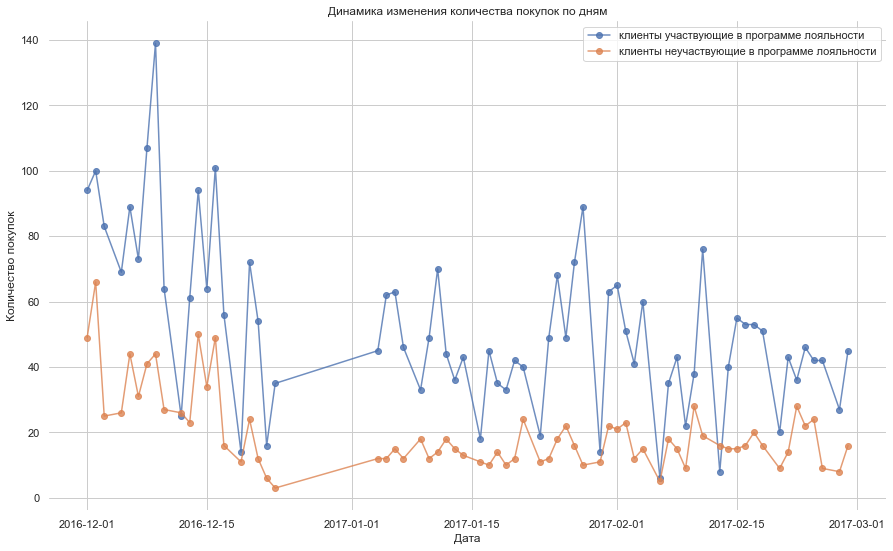

In [111]:
legend = ['клиенты участвующие в программе лояльности',
            'клиенты неучаствующие в программе лояльности']
# Сформируем график изменения динамики числа покупок 
fig, ax = plt.subplots(figsize=(15,9))
ax.set(frame_on=False)
purchases_by_days.pivot_table(values='number_of_purchases', index='purchase_date',
                                    columns=['loyalty_program'], aggfunc=np.sum).plot(ax=ax, style='-o', alpha=.8)
plt.legend(legend)
plot_names(ax, 'Динамика изменения количества покупок по дням', 'Дата', 'Количество покупок')

Динамика изменения общего числа покупок для клиентов участвующих в программе лояльности и нет весьма похожа, однако, в целом для клиентов не участвующих в программе лояльности наблюдается больший разброс значений количества покупок, однако, для того, чтобы судить о стабильности числа покупок для клиентов необходимо сравнить относительное количество покупок на клиента — то есть общее количество покупок деленное на количество клиентов, участвующих в программе лояльности и не учавствующих. 

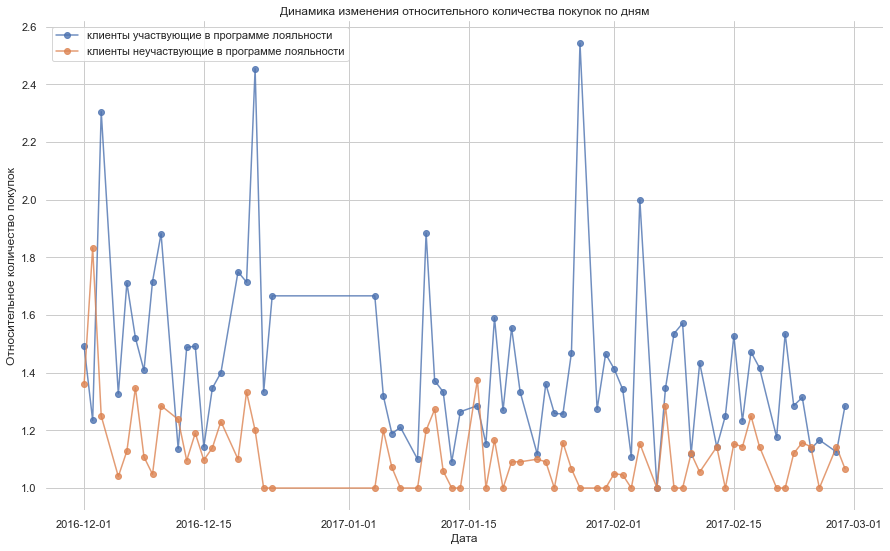

In [112]:
purchases_by_days = purchases_by_days.eval('purchases_per_customer = number_of_purchases / number_of_customers')

#Сформируем график изменения динамики относительного числа покупок 
fig, ax = plt.subplots(figsize=(15,9))
ax.set(frame_on=False)
purchases_by_days.pivot_table(values='purchases_per_customer', index='purchase_date',
                                    columns=['loyalty_program'], aggfunc=np.sum).plot(ax=ax, style='-o', alpha=.8)
plt.legend(legend)
plot_names(ax, 'Динамика изменения относительного количества покупок по дням',
                                                                       'Дата', 'Относительное количество покупок')

На графике хорошо видно, что клиенты, неучаствующие в программе лояльности, имеют большие значения относительного числа покупок — то есть, в целом, покупают чаще, чем клиенты участвующие в программе лояльности, однако значения относительного числа покупок для них изменяются в большем диапазоне, то есть такие клиенты более нестабильны в своем поведении и количество покупок, совершаемых такими клиентами может изменяться в большом диапазоне.

### 2.5.2. Изучение динамики изменения общей суммы покупок

Также как и в случае с общей стоимостью покупок посчитаем общую сумму покупок, деленную на количество клиентов, таким образом мы сможем сравнить данные без учета того насколько больше клиентов в одной из групп.

In [113]:
# Сгруппируем покупки по клиентам, дате покупки, посчитаем общую сумму покупок на пользователя
income_by_days = data.groupby(by=['loyalty_program', data.purchase_date.dt.date]) \
                                       .agg({'purchase_price': 'sum', 'customer_id': 'nunique'}).reset_index()
income_by_days.rename({'purchase_price': 'total_income',
                       'customer_id': 'number_of_customers'}, axis=1, inplace=True)
income_by_days['income_per_customer'] = income_by_days['total_income'] / income_by_days['number_of_customers']
income_by_days.head()

,loyalty_program,purchase_date,total_income,number_of_customers,income_per_customer
0,0,2016-12-01,55287.761609,63,877.583518
1,0,2016-12-02,45766.277395,81,565.015770
2,0,2016-12-03,40182.043014,36,1116.167862
3,0,2016-12-05,27482.811499,52,528.515606
4,0,2016-12-06,38131.000657,52,733.288474


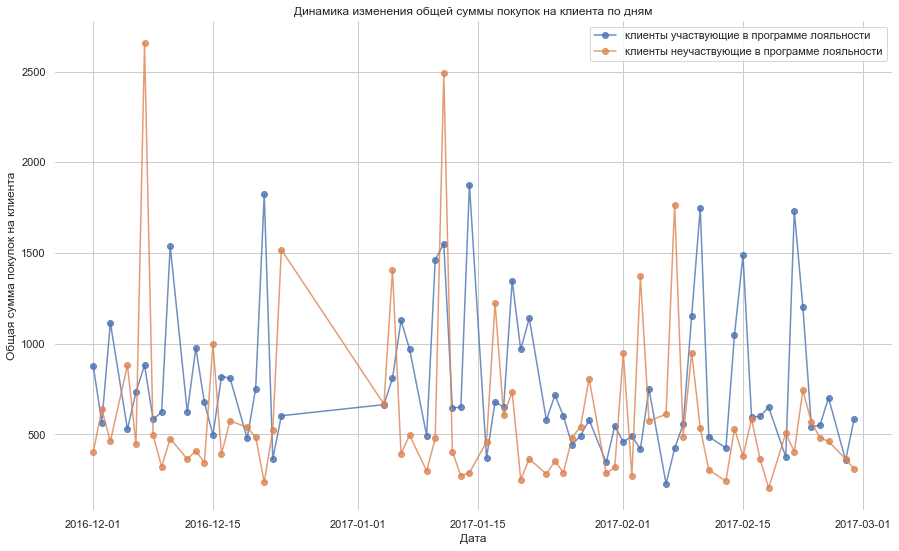

In [115]:
#Сформируем график изменения динамики общей суммы покупок на одного клиента 
fig, ax = plt.subplots(figsize=(15,9))
ax.set(frame_on=False)
income_by_days.pivot_table(values='income_per_customer', index='purchase_date',
                   columns=['loyalty_program'], aggfunc=np.sum).plot(ax=ax, style='-o', alpha=.8)
plt.legend(legend)
plot_names(ax, 'Динамика изменения общей суммы покупок на клиента по дням',
                                                        'Дата', 'Общая сумма покупок на клиента')

На графике хорошо отражается, что динамика общей суммы покупок на клиента близка для клиентов обеих групп, значения сильно зависят от дня недели — максимальные значения наблюдаются в будние дни, в выходные и праздничные дни значения суммы покупок снижаются для обеих групп, для группы клиентов не участвующих в программе лояльности значения общей суммы покупок близки к значениям для другой группы.

In [117]:
# Рассчитаем средние значения количества покупок и расходов для клиентов
# участвующих и не участвующих в программе лояльности
total = data.groupby(['loyalty_program']).agg({'purchase_id': 'nunique',
                                               'purchase_price': 'sum',
                                               'customer_id': 'nunique'}).reset_index()
total.rename({'purchase_id': 'number_of_purchases',
              'purchase_price': 'consumption',
              'customer_id': 'number_of_customers'}, axis=1, inplace=True)
total['mean_number_of_purchases'] = total['number_of_purchases'] / total['number_of_customers']
total['mean_consumption'] = total['consumption'] /  total['number_of_customers']
total.head()

,loyalty_program,number_of_purchases,consumption,number_of_customers,mean_number_of_purchases,mean_consumption
0,0,3535,1.946357e+06,1162,3.042169,1675.006008
1,1,1344,6.791818e+05,587,2.289608,1157.038871


In [118]:
group_А = total.query('loyalty_program == 1')
group_B = total.query('loyalty_program == 0')

fig = go.Figure(data=[
    go.Bar(name='участвующие в программе лояльности', y=group_А['mean_number_of_purchases']),
    go.Bar(name='неучаствующие в программе лояльности', y=group_B['mean_number_of_purchases'])
    ])

title = 'Среднее количество покупок для клиентов'
fig.update_layout(title_text= title, font=dict(size=14))
fig.update_layout(barmode='group')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

fig = go.Figure(data=[
    go.Bar(name='участвующие в программе лояльности', y=group_А['mean_consumption'], marker_color='purple'),
    go.Bar(name='неучаствующие в программе лояльности', y=group_B['mean_consumption'], marker_color='pink')
    ])

title = 'Средние расходы клиентов'
fig.update_layout(title_text= title, font=dict(size=14))
fig.update_layout(barmode='group')
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.show()

Можно сказать, что, в целом, клиенты не участвующие в программе лояльности *покупают чуть больше и на большую сумму, однако их покупки более значительно колеблются в зависимости от дня недели*, чем у клиентов участвующих в программе лояльности — то есть их расходы сложнее прогнозируемы. 

<div id='the_destination12'></div>

## 2.6. Когортный анализ.
В рамках когортного анализа попробуем оценить динамику изменения среднего чека для клиентов, совершивших первую покупку в декабре, январе и феврале 2016-2017 года и коэффициент оттока для них.

### 2.6.1. Изучение динамики среднего чека для когорт

In [129]:
# Формирование когорт покупателей по дате первого заказа
first_order_date_by_customers = data.groupby('customer_id')['purchase_date'].min() 
first_order_date_by_customers.name = 'first_order_date'
first_order_date_by_customers.head()

customer_id
0       2016-12-01 11:52:00
18026   2016-12-07 14:57:00
18027   2016-12-16 19:09:00
18029   2017-02-02 16:01:00
18031   2017-02-16 12:33:00
Name: first_order_date, dtype: datetime64[ns]

In [130]:
# Объединение с основной таблицей
data = data.join(first_order_date_by_customers, on='customer_id')
data.head(10)

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one,purchase_price,shop_type,first_order_date
0,536365,84029E,5,2016-12-01 08:26:00,23529,Shop 0,1,5.241250,26.206250,гипермаркет,2016-12-01 08:26:00
1,536365,85123A,5,2016-12-01 08:26:00,23529,Shop 0,1,3.406667,17.033333,гипермаркет,2016-12-01 08:26:00
2,536365,84029G,5,2016-12-01 08:26:00,23529,Shop 0,1,6.496667,32.483333,гипермаркет,2016-12-01 08:26:00
3,536365,84406B,7,2016-12-01 08:26:00,23529,Shop 0,1,4.253000,29.771000,гипермаркет,2016-12-01 08:26:00
4,536365,22752,1,2016-12-01 08:26:00,23529,Shop 0,1,12.440000,12.440000,гипермаркет,2016-12-01 08:26:00
5,536365,21730,5,2016-12-01 08:26:00,23529,Shop 0,1,7.332500,36.662500,гипермаркет,2016-12-01 08:26:00
6,536365,71053,5,2016-12-01 08:26:00,23529,Shop 0,1,5.975000,29.875000,гипермаркет,2016-12-01 08:26:00
7,536366,22633,5,2016-12-01 08:28:00,23529,Shop 0,1,2.040000,10.200000,гипермаркет,2016-12-01 08:26:00
8,536366,22632,5,2016-12-01 08:28:00,23529,Shop 0,1,2.040000,10.200000,гипермаркет,2016-12-01 08:26:00
9,536367,22623,2,2016-12-01 08:34:00,18726,Shop 0,0,6.740000,13.480000,гипермаркет,2016-12-01 08:34:00


Когортой можно сделать либо неделю, либо месяц, когда был сделан первый заказ. Так как у нас присутствуют данные за 3 месяца, и мы рассматриваем строительный магазин - то есть магазин, в котором покупки даже постоянными клиентами могут совершаться раз в месяц, просто потому что это товары не столь быстро расходуются, как, например, продукты или бытовая химия, то выделим когорты на основании месяца

In [131]:
# Добавляем столбец с месяцем первого заказа и месяцем осуществления покупки
data['first_order_month'] = data['first_order_date'].astype('datetime64[M]')
data['purchase_month'] = data['purchase_date'].astype('datetime64[M]')
data.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one,purchase_price,shop_type,first_order_date,first_order_month,purchase_month
0,536365,84029E,5,2016-12-01 08:26:00,23529,Shop 0,1,5.241250,26.206250,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01
1,536365,85123A,5,2016-12-01 08:26:00,23529,Shop 0,1,3.406667,17.033333,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01
2,536365,84029G,5,2016-12-01 08:26:00,23529,Shop 0,1,6.496667,32.483333,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01
3,536365,84406B,7,2016-12-01 08:26:00,23529,Shop 0,1,4.253000,29.771000,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01
4,536365,22752,1,2016-12-01 08:26:00,23529,Shop 0,1,12.440000,12.440000,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01


In [132]:
# Cгруппируем данные по столбцу с месяцем, когда был сделан первый заказ
cohort_grouped = data.groupby(['loyalty_program', 'first_order_month']) \
                     .agg({'purchase_id': 'nunique','customer_id': 'nunique', 'purchase_price': 'sum'}) \
                     .reset_index()

cohort_grouped.rename({"purchase_id": "number_of_purchases",
                       "customer_id": "number_of_customers",
                       "purchase_price": "revenue"}, axis=1, inplace=True)
cohort_grouped

,loyalty_program,first_order_month,number_of_purchases,number_of_customers,revenue
0,0,2016-12-01,2725,605,1.499232e+06
1,0,2017-01-01,495,296,3.081971e+05
2,0,2017-02-01,315,261,1.389276e+05
3,1,2016-12-01,986,344,5.314367e+05
4,1,2017-01-01,199,124,7.150747e+04
5,1,2017-02-01,159,119,7.623769e+04


In [ ]:
fig, ax = plt.subplots(figsize=(15,9))
ax.set(frame_on=False)
income_by_days.pivot_table(values='income_per_customer', index='purchase_date',
                   columns=['loyalty_program'], aggfunc=np.sum).plot(ax=ax, style='-o', alpha=.8)
plt.legend(legend)
plot_names(ax, 'Динамика изменения общей суммы покупок на клиента по дням',
                                                        'Дата', 'Общая сумма покупок на клиента')

In [144]:
# В связи с необходимостью строить графики для сравнения основных параметров для когорт составим 2 функции 
# — на основе библиотеки matplotlib и plotly
def comparision_plots_lines(df, x, y, x_name):
    for element in y:
        fig, ax = plt.subplots(figsize=(15,9))
        
        df.pivot_table(values=element, index=x,
                   columns=['loyalty_program'], aggfunc=np.sum).plot(ax=ax, style='-o', alpha=.8)
        title = 'Динамика измененения показателя {}'.format(element)
        plt.legend(legend)
        ax.set(frame_on=False)
        plot_names(ax, title, x_name, 'Показатель {}'.format(element))
        
def comparision_bar_chart(df, x, y):
        for element in y:
            group_А = df.query('loyalty_program == 1')
            group_B = df.query('loyalty_program == 0')
            fig = go.Figure(data=[
                go.Bar(name='клиенты, участвующие в программе лояльности', y=group_А[element], x=group_А[x]),
                go.Bar(name='клиенты, неучаствующие в программе лояльностм', y=group_B[element], x=group_B[x])
            ])

            fig.update_traces(textposition='outside')
            title = 'Динамика измененения показателя {}'.format(element)
            fig.update_layout(title_text=title, font=dict(size=14))
            fig.update_layout(barmode='group')
            fig.show()

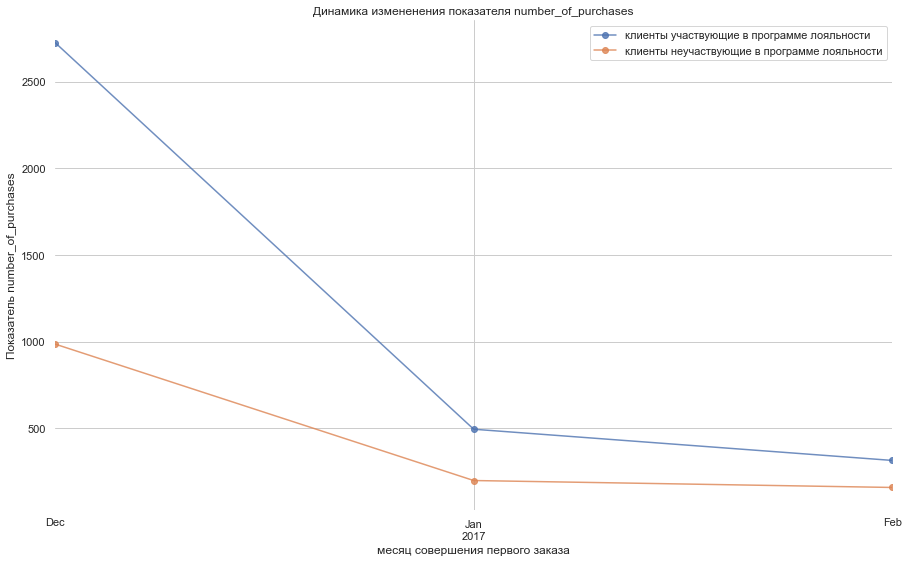

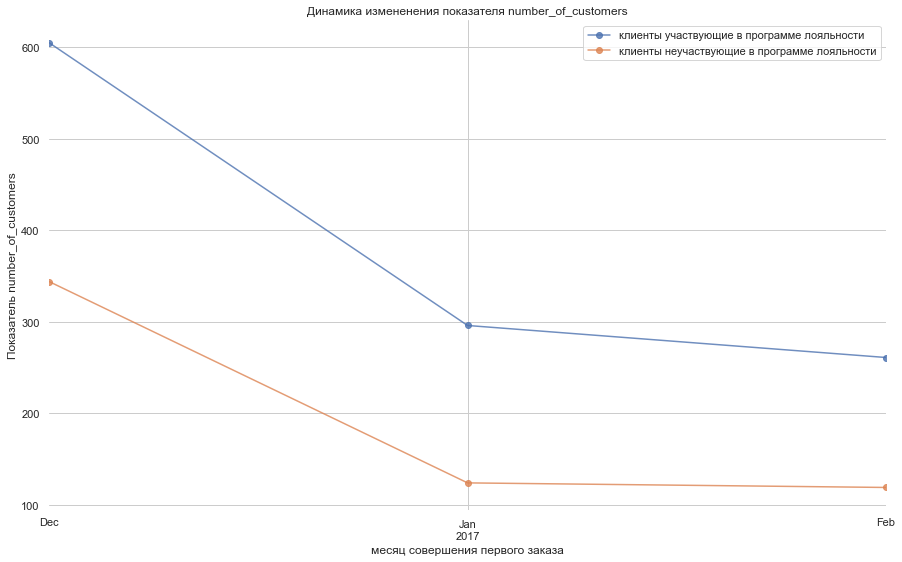

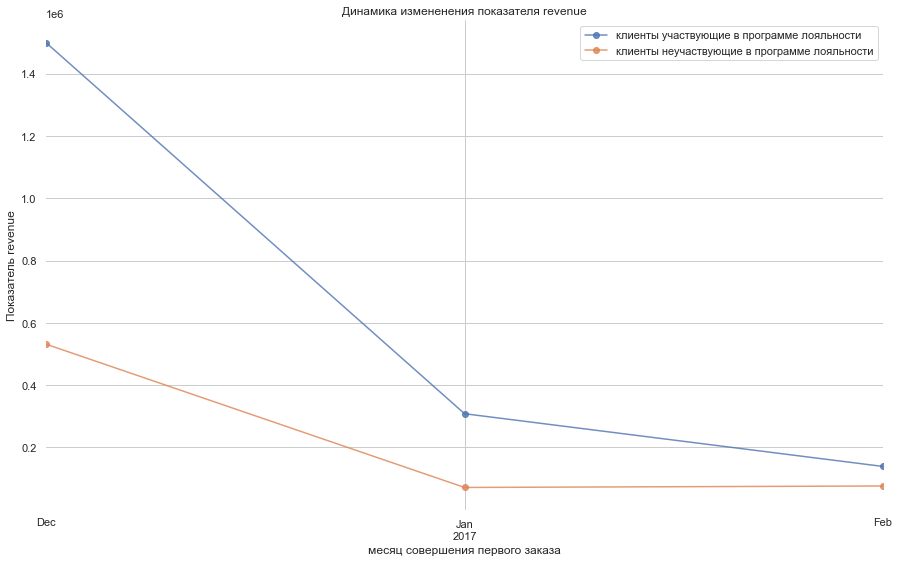

In [145]:
comparision_plots_lines(cohort_grouped, 'first_order_month', list_of_metrics, 'месяц совершения первого заказа')

In [146]:
list_of_metrics = ['number_of_purchases', 'number_of_customers', 'revenue']
comparision_bar_chart(cohort_grouped, 'first_order_month', list_of_metrics)

На полученных графиках изменения количества покупок, количества клиентов и выручки для клиентов различных когорт заметно:
   - количество клиентов, количество покупок и выручка в более поздних когортах ниже, чем в более ранних
   - количество клиентов, покупок, выручка ниже для когорт клиентов, участвующих в программе лояльности
   - количество покупок и выручка для более поздних когорт клиентов, не участвующих в программе лояльности, падает значительно более резко, чем у клиентов участвующих в программе лояльности, то есть клиенты участвующие в программе лояльности чуть лучше удерживаются и менее подвержены сезонному снижению количества клиентов.

In [147]:
# Сгруппируем данные по когорте и текущему месяцу, рассчитаем средний чек
orders_grouped_by_cohorts = data.groupby(['loyalty_program', 'first_order_month','purchase_month']) \
                                .agg({'purchase_price':'sum','customer_id':'nunique'}) \
                                .reset_index()
orders_grouped_by_cohorts.rename({"customer_id": "number_of_customers",
                                  "purchase_price": "revenue"}, axis=1, inplace=True)
orders_grouped_by_cohorts = orders_grouped_by_cohorts.eval('revenue_per_user = revenue / number_of_customers') 
orders_grouped_by_cohorts

,loyalty_program,first_order_month,purchase_month,revenue,number_of_customers,revenue_per_user
0,0,2016-12-01,2016-12-01,706906.551119,605,1168.440580
1,0,2016-12-01,2017-01-01,451095.081073,248,1818.931779
2,0,2016-12-01,2017-02-01,341230.656287,197,1732.135311
3,0,2017-01-01,2017-01-01,238483.826749,296,805.688604
4,0,2017-01-01,2017-02-01,69713.309281,71,981.877596
5,0,2017-02-01,2017-02-01,138927.556922,261,532.289490
6,1,2016-12-01,2016-12-01,299170.118037,344,869.680576
7,1,2016-12-01,2017-01-01,115952.048653,115,1008.278684
8,1,2016-12-01,2017-02-01,116314.489033,121,961.276769
9,1,2017-01-01,2017-01-01,58555.438170,124,472.221276


In [148]:
# Сформируем таблицу с изменением среднего чека для когорт для покупателей
# участвующих и неучаствующих в программе лояльности
revenue_per_user_pivot_1 = orders_grouped_by_cohorts.query('loyalty_program == 1') \
                                                    .pivot_table(index='first_order_month',
                                                                 columns='purchase_month',
                                                                 values='revenue_per_user',
                                                                 aggfunc='mean') 
revenue_per_user_pivot_0 = orders_grouped_by_cohorts.query('loyalty_program == 0') \
                                                    .pivot_table(index='first_order_month',
                                                                 columns='purchase_month',
                                                                 values='revenue_per_user',
                                                                 aggfunc='mean') 

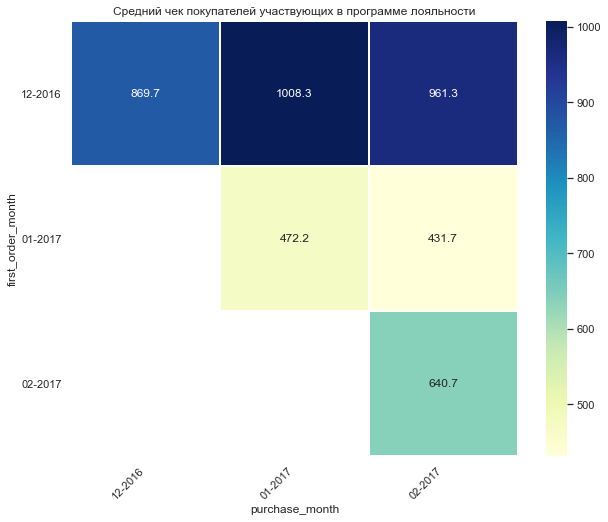

In [177]:
fig, ax = plt.subplots(figsize=(10,8))
plt.title('Средний чек покупателей участвующих в программе лояльности')
sns.heatmap(revenue_per_user_pivot_1, annot=True, fmt='.1f', linewidths=1, cmap="YlGnBu")
ax.set_xticklabels([*map(lambda x: x.date().strftime("%m-%Y"), revenue_per_user_pivot_1.columns)],
                                                                                    rotation=45, ha='right')
ax.set_yticklabels([*map(lambda x: x.date().strftime("%m-%Y"), revenue_per_user_pivot_1.index)], ha='right');

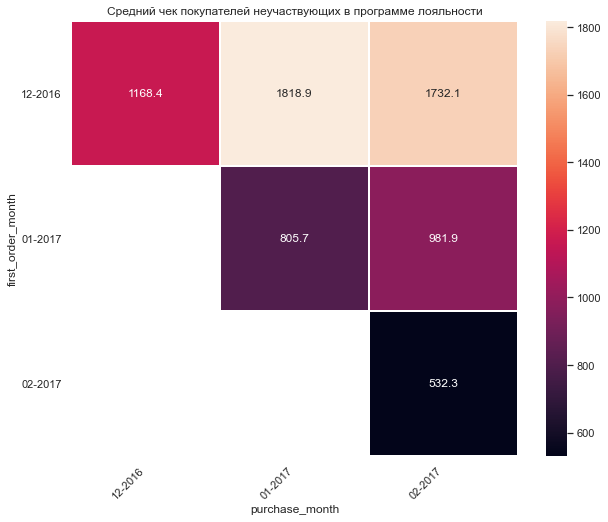

In [176]:
fig, ax = plt.subplots(figsize=(10,8))
plt.title('Средний чек покупателей неучаствующих в программе лояльности')
sns.heatmap(revenue_per_user_pivot_0, annot=True, fmt='.1f', linewidths=1)
ax.set_xticklabels([*map(lambda x: x.date().strftime("%m-%Y"), revenue_per_user_pivot_0.columns)],
                                                                                    rotation=45, ha='right')
ax.set_yticklabels([*map(lambda x: x.date().strftime("%m-%Y"), revenue_per_user_pivot_0.index)], ha='right');

На тепловых картах видно, что если для покупателей не участвующих в программе лояльности средний чек продолжает снижаться с течением времени, то для покупателей, участвующих в программе лояльности, после снижения в январе средний чек увеличивается.

### 2.6.2. Определение динамики коэффициента оттока

In [178]:
# Теперь для каждой строки датафрейма можно рассчитать lifetime пользователя в рамках когорты
data['cohort_lifetime'] = data['purchase_month'] - data['first_order_month']
data['cohort_lifetime'] = data['cohort_lifetime'] / np.timedelta64(1,'M')
data['cohort_lifetime'] = data['cohort_lifetime'].astype('int')
data.head()

,purchase_id,item_id,quantity,purchase_date,customer_id,shop_id,loyalty_program,price_per_one,purchase_price,shop_type,first_order_date,first_order_month,purchase_month,cohort_lifetime
0,536365,84029E,5,2016-12-01 08:26:00,23529,Shop 0,1,5.241250,26.206250,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01,0
1,536365,85123A,5,2016-12-01 08:26:00,23529,Shop 0,1,3.406667,17.033333,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01,0
2,536365,84029G,5,2016-12-01 08:26:00,23529,Shop 0,1,6.496667,32.483333,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01,0
3,536365,84406B,7,2016-12-01 08:26:00,23529,Shop 0,1,4.253000,29.771000,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01,0
4,536365,22752,1,2016-12-01 08:26:00,23529,Shop 0,1,12.440000,12.440000,гипермаркет,2016-12-01 08:26:00,2016-12-01,2016-12-01,0


In [179]:
# Сгруппируем данные по когорте и lifetime. Посчитаем для каждой когорты количество
# активных пользователей на месяц жизни
cohorts = data.groupby(['loyalty_program', 'first_order_month','cohort_lifetime']) \
              .agg({'customer_id':'nunique'}) \
              .reset_index() 
cohorts.head()

,loyalty_program,first_order_month,cohort_lifetime,customer_id
0,0,2016-12-01,0,605
1,0,2016-12-01,1,248
2,0,2016-12-01,2,197
3,0,2017-01-01,0,296
4,0,2017-01-01,1,71


In [180]:
# Найдём исходное количество пользователей в когорте 
initial_users_count = cohorts.query('cohort_lifetime == 0')[['first_order_month','customer_id', 'loyalty_program']]
initial_users_count = initial_users_count.rename({'customer_id':'cohort_users'}, axis=1) 
initial_users_count

,first_order_month,cohort_users,loyalty_program
0,2016-12-01,605,0
3,2017-01-01,296,0
5,2017-02-01,261,0
6,2016-12-01,344,1
9,2017-01-01,124,1
11,2017-02-01,119,1


In [181]:
# Объединим данные по когортам с исходным количеством пользователей в когорте
cohorts = cohorts.merge(initial_users_count, on=['first_order_month', 'loyalty_program'])
cohorts.head()

,loyalty_program,first_order_month,cohort_lifetime,customer_id,cohort_users
0,0,2016-12-01,0,605,605
1,0,2016-12-01,1,248,605
2,0,2016-12-01,2,197,605
3,0,2017-01-01,0,296,296
4,0,2017-01-01,1,71,296


In [182]:
# Рассчитаем Retention Rate, разделив количество активных пользователей в каждый из месяцев 
# на исходное число пользователей в когорте
cohorts['retention'] = cohorts['customer_id'] / cohorts['cohort_users']
cohorts

,loyalty_program,first_order_month,cohort_lifetime,customer_id,cohort_users,retention
0,0,2016-12-01,0,605,605,1.000000
1,0,2016-12-01,1,248,605,0.409917
2,0,2016-12-01,2,197,605,0.325620
3,0,2017-01-01,0,296,296,1.000000
4,0,2017-01-01,1,71,296,0.239865
5,0,2017-02-01,0,261,261,1.000000
6,1,2016-12-01,0,344,344,1.000000
7,1,2016-12-01,1,115,344,0.334302
8,1,2016-12-01,2,121,344,0.351744
9,1,2017-01-01,0,124,124,1.000000


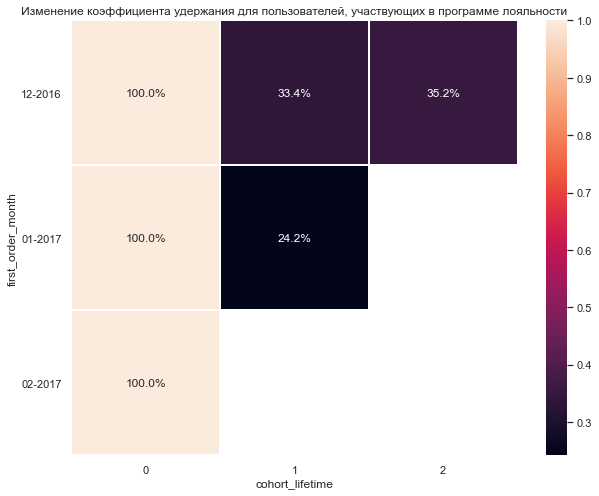

In [310]:
retention_pivot = cohorts.query('loyalty_program == 1').pivot_table(index='first_order_month',
                                                                    columns='cohort_lifetime',
                                                                    values='retention',
                                                                    aggfunc='sum')

fig, ax = plt.subplots(figsize=(10,8))
plt.title('Изменение коэффициента удержания для пользователей, участвующих в программе лояльности')
sns.heatmap(retention_pivot, annot=True, fmt='.1%', linewidths=1)
ax.set_yticklabels([*map(lambda x: x.date().strftime("%m-%Y"), retention_pivot.index)], ha='right');

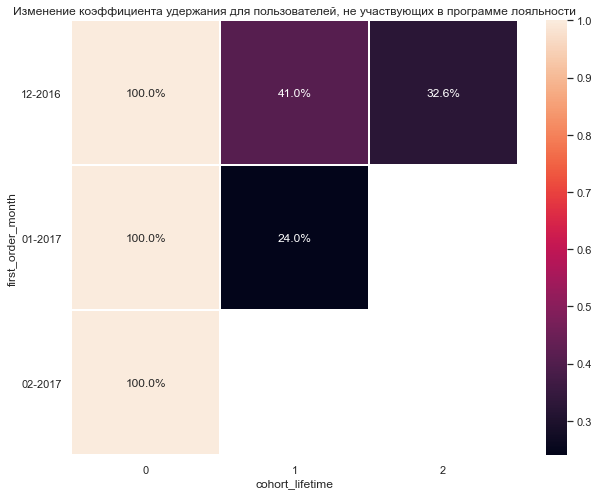

In [311]:
retention_pivot_0 = cohorts.query('loyalty_program == 0').pivot_table(index='first_order_month',
                                                                      columns='cohort_lifetime',
                                                                      values='retention',
                                                                      aggfunc='sum')

fig, ax = plt.subplots(figsize=(10,8))
plt.title('Изменение коэффициента удержания для пользователей, не участвующих в программе лояльности')
sns.heatmap(retention_pivot_0, annot=True, fmt='.1%', linewidths=1)
ax.set_yticklabels([*map(lambda x: x.date().strftime("%m-%Y"), retention_pivot_0.index)], ha='right');

На основании построенных тепловых карт для коэффициента удержания для пользователей, участвующих и неучаствующих в программе лояльности, можно сказать, что коэффициент удержания для обеих групп примерно одинаков, то есть программа лояльности значительно не влияет на коэффициент удержания пользователей

На основании проведенного когортного анализа можно сделать следующие выводы.

   - Количество покупок и выручка для более поздних когорт клиентов, не участвующих в программе лояльности, падает значительно более резко, чем у клиентов участвующих в программе лояльности, то есть клиенты участвующие в программе лояльности чуть менее подвержены сезонному снижению общего количества.
   - Для покупателей не участвующих в программе лояльности средний чек продолжает снижаться с течением времени, для покупателей, участвующих в программе лояльности, после снижения в январе средний чек увеличивается.
   - Коэффициент удержания для обеих групп примерно одинаков, то есть программа лояльности значительно не влияет на коэффициент удержания пользователей

То есть можно сказать, что клиенты, участвующие в программе лояльности не отличаются по коэффициенту удержания, однако, те из клиентов, которые продолжают совершать покупки — покупают на большую сумму и меньше подвержены сезонному снижению активности, чем клиенты не участвующие в программе лояльности.

<div id='the_destination13'></div>

# Вывод по разделу

 1. Клиенты не участвующие в программе лояльности *покупают больше товаров*, чем клиенты не участвующие в программе лояльности, но *меньшей стоимости*.
 2. Поведение клиентов, не участвующих в программе лояльности, значительно *сильнее подверженно влиянию сезона или дня недели*, они менее прогнозируемы.
 3. Коэффициент удержания для клиентов обеих групп *не отличается*.
 4. Клиенты, участвующие в программе лояльности, возвращающиеся через несколько месяцев в *тратят в среднем чуть больше*, чем неучаствующие.

<div id='the_destination14'></div>

# 3. Статистический анализ данных

<div id='the_destination15'></div>

## 3.1. Формирование гипотез

В рамках проекта необходимо проверить два основных утверждения:
 1. приносят ли клиенты, участвующие в программе лояльности, больше денег?
 2. чаще ли они покупают, чем клиенты не участвующие в программе лояльности?

Начнём с формулировки нулевой гипотезы $H_{0}$ для первого утверждения: «средние расходы для клиентов, участвующих в программе лояльности, и неучавствующих — не имеют статистически хначимых различий». 

Чтобы выбрать метод для проверки справедливости этой гипотезы необходимо оценить является ли распределение расходов клиентов нормальным или нет, если распределение является нормальным, то можно воспользоваться критерием Стьюдента для параметрических данных и функцией `scipy.stats.ttest_ind`, однако, если распределение значимо оличается от нормального — необходимо воспользоваться методом Манна-Уитни и функцией `scipy.stats.mannwhitneyu`.

In [312]:
# Формирование таблицы с информацией о клиентах, их расходах и количестве их покупок
customers = data.groupby(['loyalty_program', 'customer_id']) \
                .agg({'purchase_id': 'nunique', 'purchase_price': 'sum'}) \
                .reset_index()
customers.rename({'purchase_id': 'number_of_purchases', 'purchase_price': 'consumption'}, axis=1, inplace= True)
customers.head(10)

,loyalty_program,customer_id,number_of_purchases,consumption
0,0,0,736,288026.295742
1,0,18026,2,1718.362024
2,0,18027,2,1850.373286
3,0,18029,1,385.261000
4,0,18031,1,370.659667
5,0,18035,1,3614.032738
6,0,18038,2,1947.140071
7,0,18040,1,260.897000
8,0,18041,2,606.975738
9,0,18044,3,910.241864


Для проверки нормальности распределение можно построить гистограмму распределения величины, например, воспользовавшись библиотекой `seaborn.displot()`, однако также можно воспользоваться библиотекой `scipy` оценив нормальность распределения численно - `scipy.stats.normaltest` или же построив график при помощи `scipy.stats.probplot`, для лучшей визуализации результата воспользуемся вторым методом.

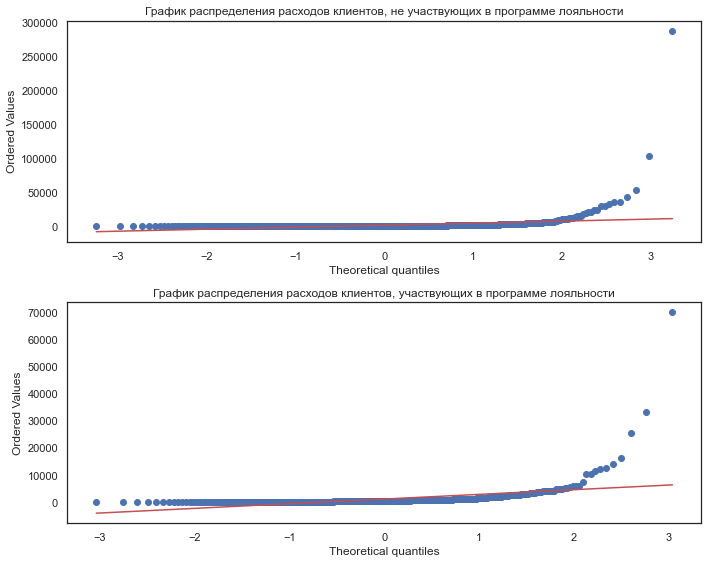

In [314]:
fig, ax = plt.subplots(2, 1, figsize=(10,8))
consumption_0 = customers[customers['loyalty_program'] == 0]['consumption']
res = stats.probplot(consumption_0, plot=ax[0])
ax[0].set_title("График распределения расходов клиентов, не участвующих в программе лояльности")

consumption_1 = customers[customers['loyalty_program'] == 1]['consumption']
res = stats.probplot(consumption_1, plot=ax[1])
ax[1].set_title("График распределения расходов клиентов, участвующих в программе лояльности")
plt.tight_layout()
plt.show()

Распределение значений не соответствует нормальному распределению (обозначено на графике красной линией), поэтому для оценки справедливости гипотезы необходимо воспользоваться методом Манна-Уитни.

Сформулируем нулевую гипотезу $H_{0}$ для второго утверждения: «среднее количество покупок для клиентов, участвующих в программе лояльности, и неучаствующих не имеет статистически значимых различий». Также как для первой гипотезы осуществим оценку нормальности распределений.

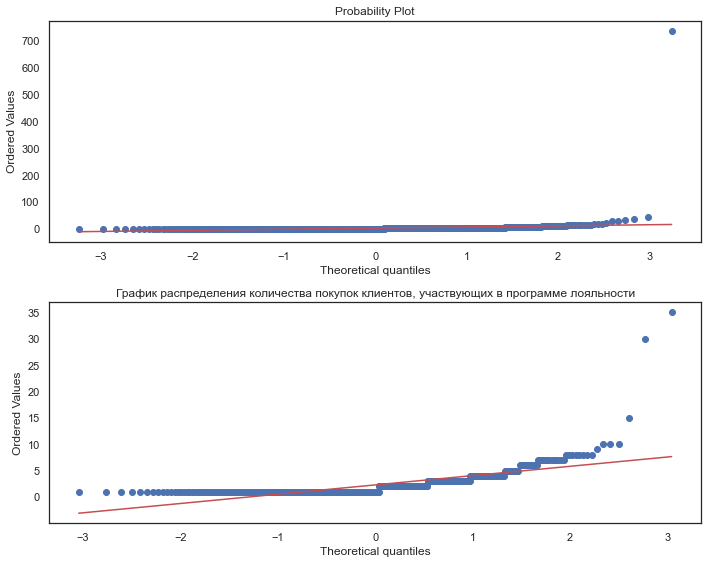

In [315]:
fig, ax = plt.subplots(2, 1, figsize=(10,8))
purchases_0 = customers[customers['loyalty_program'] == 0]['number_of_purchases']
res = stats.probplot(purchases_0, plot=ax[0])
ax[1].set_title("График распределения количества покупок клиентов, не участвующих в программе лояльности")

purchases_1 = customers[customers['loyalty_program'] == 1]['number_of_purchases']
res = stats.probplot(purchases_1, plot=ax[1])
ax[1].set_title("График распределения количества покупок клиентов, участвующих в программе лояльности")
plt.tight_layout()
plt.show()

Как и для первой гипотезы, распределения для покупок клиентов не являются нормальными и для оценки справедливости гипотезы необходимо воспользоваться методом Манна-Уитни для непараметрических данных.

<a id='the_destination16'></a>
## 3.2. Проверка гипотез

Для проверки нулевых гипотез воспользуемся тестом Манна-Уитни в связи с тем, что мы имеем независимые выборки с непрерывным распределением, не обязательно нормальным, не обязательно с однинаковой дисперсией, с большими по сравнению с нормальным распределением выбросами. Критический уровень значимости оценим в 5%. 

### Тест Манна-Уитни для расходов по группам

In [334]:
# Проверка первой гипотезы 
alpha = 0.05
print('Критический уровень статистической значимости', alpha)
# Расходы для клиентов обеих групп

sample = customers.pivot_table(index=customers.index, values='consumption', columns='loyalty_program')
p_value = stats.mannwhitneyu(sample[0].dropna(), sample[1].dropna())[1]
print("Значение p-value для сравнения расходов клиентов {0:.5f}".format(p_value))

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: есть статистически значимые различия в расходах клиентов")
else:
    print("Не получилось отвергнуть нулевую гипотезу о том, \
что статистически значимых различий в расходах клиентов нет")

Критический уровень статистической значимости 0.05
Значение p-value для сравнения расходов клиентов 0.01828
Отвергаем нулевую гипотезу: есть статистически значимые различия в расходах клиентов


Между клиентами, участвующими в программе лояльности и неучаствующими, есть значимые различия в расходах, клиенты разных групп тратят средства по-разному.

### Тест Манна-Уитни для количества покупок по группам

In [336]:
# Проверка второй гипотезы 
alpha = 0.05
print('Критический уровень статистической значимости', alpha)
# Расходы для клиентов обеих групп
sample = customers.pivot_table(index=customers.index, values='number_of_purchases', columns='loyalty_program')

p_value = stats.mannwhitneyu(sample[0].dropna(), sample[1].dropna())[1]
print("Значение p-value для сравнения количества покупок клиентов {0:.5f}".format(p_value))

if (p_value < alpha):
    print("Отвергаем нулевую гипотезу: есть статистически значимые различия в количестве покупок клиентов")
else:
    print("Не получилось отвергнуть нулевую гипотезу о том, \
что статистически значимых различий в количестве покупок клиентов нет")

Критический уровень статистической значимости 0.05
Значение p-value для сравнения количества покупок клиентов 0.18161
Не получилось отвергнуть нулевую гипотезу о том, что статистически значимых различий в количестве покупок клиентов нет


Между клиентами, участвующими в программе лояльности и не участвующими, нет значимых различий в количестве покупок, клиенты не участвующие в программе лояльности покупают столько же сколько и участвующие.

<div id='the_destination17'></div>

# Вывод по разделу

В результате статистического анализа установили, что в средних расходах и среднем количестве покупок у клиентов, участвующих в программе лояльности и неучавствующих, существуют статистически значимые различия, то есть *клиенты неучаствующие в программе лояльности тратят меньше или больше, а покупают также часто как и участвующие*.

<div id='the_destination18'></div>

# 4. Кластеризация

<a id='the_destination19'></a>
## 4.1. Кластеризация клиентов

На основании статистического и исследовательского анализа данных были сделаны следующие выводы: 
   - Клиенты не участвующие в программе лояльности в среднем тратят больше
   - Количество покупок для клиентов участвующих в программе лояльности и нет — одинаково
   - Клиенты участвующие в программе лояльности чуть более стабильны в своих тратах, и те из клиентов, кто возвращается через несколько месяцев тратят чуть больше, чем клиенты, не участвующие в программе лояльности
   - Коэффициент удержания для клиентов обеих групп одинаков
    
В целом это говорит о том, что программа лояльности не эффективна, хотя клиенты участвующие в программе лояльности и покупают чуть более дорогие вещи, и чуть более стабильны в своих тратах, однако ни клиентам, ни магазину нынешняя ситуация не выгодна. Поэтому необходимо модернизировать программу лояльности. Модернизировать программу лояльности можно различными способами, например, внедрив накопительную систему скидок или индивидуальных предложений, привлекая магазины-партнеров к акциям или же составив различные предложения для групп клиентов, с учетом их индивидуальных предпочтений, для этого мы воспользуемся машинным обучением.

### 4.1.1. Построение матрицы расстояний и визуализация дендрограммы

In [342]:
customers = data.query('loyalty_program == 1') \
                .groupby(['customer_id']) \
                .agg(total_quantity=('quantity', sum),
                     total_consumption=('purchase_price', sum),
                     total_number_of_purchases=('purchase_id', 'nunique'),
                     number_of_items_types=('item_id', 'nunique'),
                     mean_price_of_purchase=('purchase_price', 'mean'),
                     mean_purchase_quantity=('quantity', 'mean'),
                     favourite_shop_type=('shop_type', lambda x: x.value_counts().idxmax())) \
                .reset_index()

customers.head()

,customer_id,total_quantity,total_consumption,total_number_of_purchases,number_of_items_types,mean_price_of_purchase,mean_purchase_quantity,favourite_shop_type
0,22005,44,216.182262,2,39,5.147197,1.047619,42
1,22006,756,10456.300365,2,73,103.527726,7.485149,101
2,22011,29,107.430500,1,10,9.766409,2.636364,11
3,22012,4280,3358.930167,3,4,839.732542,1070.000000,4
4,22018,3,8.486667,1,17,0.471481,0.166667,18


### 4.1.1.1. Стандартизация и нормализация данных

In [343]:
# Выделим признаки
features = customers.drop(['customer_id'], axis=1)
# Преобразуем категориальные переменные
features_dummies = pd.get_dummies(features) # представление одного категориального поля в множество бинарных полей 

#создадим объект класса StandardScaler и применим его к обучающей выборке
scaler = StandardScaler()
# Cтандартизация исходных признаков
features_scaled = scaler.fit_transform(features_dummies)

### 4.1.1.2. Построение матрицы расстояний и визуализация дендрограммы

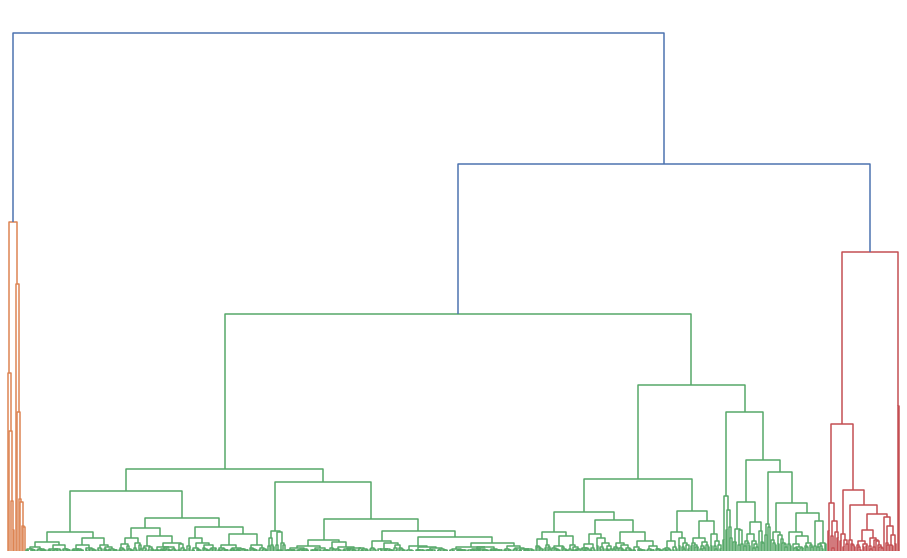

In [346]:
# Формирование таблицы "связок" между объектами
linked = linkage(features_scaled, method='ward') 
# визуализация дендрограммы
plt.figure(figsize=(16,10))  
dendrogram(linked, orientation='top')
plt.axis('off')
# plt.xticks(None)
plt.show() 

На основании полученной дендрограммы можно предположить, что оптимальное число кластеров 4 — четыре разных цвета на графике.

### 4.1.2. Обучение модели и прогнозирование кластеров

In [347]:
# зададим модель k_means с числом кластеров 4
k_model = KMeans(n_clusters=4) 

# применим алгоритм к данным и сформируем вектор кластеров 
labels = k_model.fit_predict(features_scaled)

# сохраняем метки кластера в поле нашего датасета
features['cluster_number'] = labels
features.head()

,total_quantity,total_consumption,total_number_of_purchases,number_of_items_types,mean_price_of_purchase,mean_purchase_quantity,favourite_shop_type,cluster_number
0,44,216.182262,2,39,5.147197,1.047619,42,0
1,756,10456.300365,2,73,103.527726,7.485149,101,1
2,29,107.430500,1,10,9.766409,2.636364,11,0
3,4280,3358.930167,3,4,839.732542,1070.000000,4,3
4,3,8.486667,1,17,0.471481,0.166667,18,0


In [370]:
# Сгруппируем данные по кластерам
clusters = features.groupby(['cluster_number']).agg({'total_quantity': 'mean',
                     'total_consumption': 'mean',
                     'total_number_of_purchases': 'mean',
                     'number_of_items_types': 'mean',
                     'mean_price_of_purchase': 'mean',
                     'mean_purchase_quantity': 'mean',
                     'favourite_shop_type': lambda x: x.value_counts().idxmax()})
#clusters.rename({'favourite_shop_type_гипермаркет': 'гипермаркет',
#                 'favourite_shop_type_пункт выдачи': 'пункт выдачи',
#                 'favourite_shop_type_розничный магазин': 'розничный магазин'}, axis=1, inplace=True)
clusters

,total_quantity,total_consumption,total_number_of_purchases,number_of_items_types,mean_price_of_purchase,mean_purchase_quantity,favourite_shop_type
cluster_number,,,,,,,
0,212.080851,601.409313,1.704255,21.657447,46.118340,15.020717,1
1,583.819048,1894.877002,4.561905,90.438095,20.717847,6.305540,70
2,8468.714286,25798.295320,8.000000,57.000000,640.468046,167.300305,75
3,3547.800000,3393.857530,1.600000,3.000000,1565.075939,1191.146667,5


Мы получили 4 основных группы клиентов, пользующихся программой лояльности. Теперь проанализируем их особенности.

<div id='the_destination20'></div>

## 4.2. Выявление особенностей для кластеров

### 4.2.1 Анализ таблицы с средними значениями признаков для кластеров

In [371]:
clusters

,total_quantity,total_consumption,total_number_of_purchases,number_of_items_types,mean_price_of_purchase,mean_purchase_quantity,favourite_shop_type
cluster_number,,,,,,,
0,212.080851,601.409313,1.704255,21.657447,46.118340,15.020717,1
1,583.819048,1894.877002,4.561905,90.438095,20.717847,6.305540,70
2,8468.714286,25798.295320,8.000000,57.000000,640.468046,167.300305,75
3,3547.800000,3393.857530,1.600000,3.000000,1565.075939,1191.146667,5


В таблицы приведены 4 группы клиентов, пользующихся программой лояльности, причем их признаки различаются довольно существенно:
* __Группа 0.__ Это покупатели, осуществляющие покупки в основном в гипермаркетах, они покупают не очень часто и не слишком большие заказы, в неделю они покупают редко (в среднем 2 заказа за период), их заказы содержат среднее количество недорогих товаров.
* __Группа 1.__ Это покупатели, предпочитающие розничные магазины, их заказы небольшие и недорогие
* __Группа 2.__ Это покупатели, предпочитающие пункты выдачи, это большая группа, приносящая существенный доход, их заказы недорогие, но содержат большое количество товаров
* __Группа 3.__ Это покупатели, осуществляющие покупки в основном в гипермаркетах, они приносят существенный доход, их заказы дорогие и содержат много разнообразных товаров, эти покупатели совершают покупают наиболее часто, по сравнению с остальными группами.

### 4.2.2. Анализ распределения признаков

In [440]:
# создание функции построение гистограмм распределения
def hist_for_clusters(df, columns):
    grouped = df.groupby('cluster_number')
    fig, axes = plt.subplots(4, 4, figsize=(18, 11))
    fig.tight_layout(pad=2.5)
    i = 0
    for col in columns:
        for group in grouped.groups.keys():
            ax = axes[i//4,i%4]
            sns.distplot(df.loc[grouped.groups[group]][col], ax=ax)
            ax.set_title(f'cluster {group}')
            i += 1

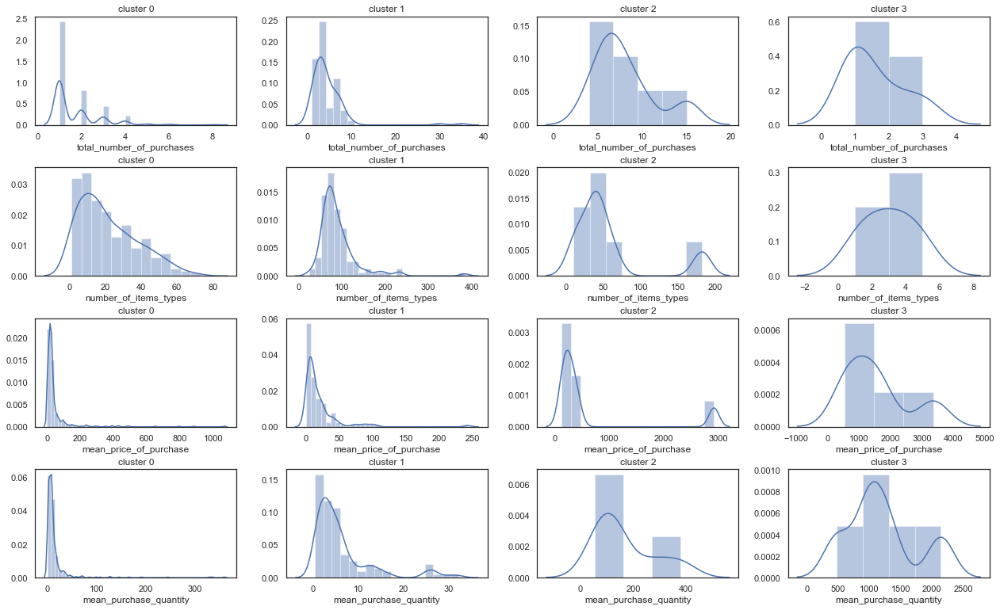

In [441]:
list_of_characteristics = ['total_number_of_purchases', 
                           'number_of_items_types',  'mean_price_of_purchase', 'mean_purchase_quantity']
hist_for_clusters(features, list_of_characteristics)

 На основании анализа гистограмм можно сделать следующие выводы:
 * Наиболее часто покупающие кластеры клиентов — 0 и 3
 * Больше всего тратят клиенты кластеров 0 и 3
 * Клиенты кластера 1 покупают немного, нечасто и небольшие заказы
 * Покупатели кластера 2 осуществляют и небольшие заказы и большие, но среди них нет тех, кто заказывал более 4 раз за исследуемый период, среди этих клиентов достаточно много тех, кто заказывает однотипные товары (то есть при значительном количестве товаров, количество типов товаров достаточно невелико)

In [442]:
# определим функцию отрисовки графиков попарных признаков для кластеров
def show_clusters_on_plot(df, x_name, y_name, cluster_name):
    plt.figure(figsize =(10,10))
    sns.scatterplot(df[x_name], df[y_name], hue=df[cluster_name], palette='tab10', size=df[x_name])
    plt.title('{} vs {}'.format(x_name, y_name))
    plt.show()

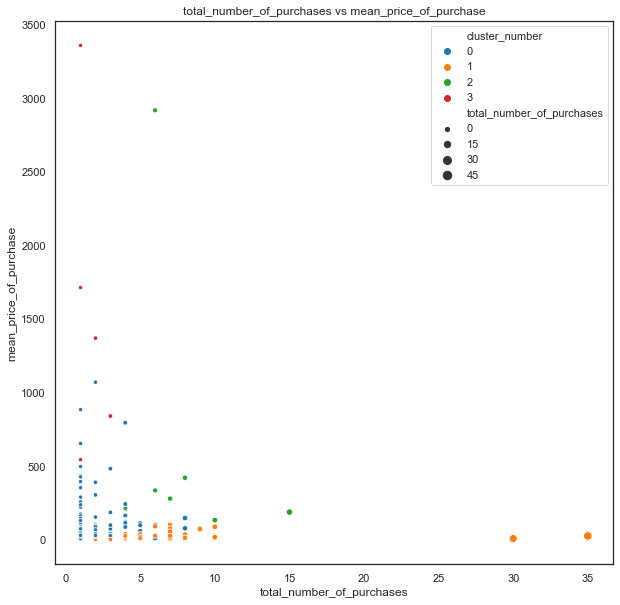

In [443]:
show_clusters_on_plot(features, 'total_number_of_purchases', 'mean_price_of_purchase', 'cluster_number')

На графике попарных признаков для кластеров видно, что наибольшее количество заказов у клиентов кластера 0, клиенты кластера 3 осуществляют меньше заказов, но их заказы наиболее дорогие, клиенты кластера 2 покупают достаточно часто, их заказы небольшой цены.

<div id='the_destination21'></div>

## 4.3. Формирование рекомендаций по изменению программы лояльности

Для каждой из выделенных групп можно предложить свою программу лояльности, в соответствии с особенностями их поведения. 
- __Для группы 0__: так как это часто покупающие в гипермаркетах покупатели, но их покупки не очень большие, то для них будет актуально введение накопительных программ, когда скидка увеличивается при большом количестве покупок — таким образом мы можем стимулировать их покупать более дорогие товары. 
- __Для группы 1__: это розничные покупатели, покупающие редко и мало, для таких покупателей наиболее актуальна будет схема возможности покупки товаров по акции, и схемы скидок, связанных с праздничными днями
- __Для группы 2__: так как это покупатели, заказывающие через пункты выдачи, то им будет актуально введение скидок на доставку и так как многие из их заказов однотипны, то целесообразно ввести скидки на «любимые» (наиболее часто покупаемые) товары
- __Для группы 3__: в связи с тем, что эти клиенты покупают в гипермаркетах крупные и дорогие товары, то для них будет актуальна как накопительная скидка, так и скидки на доставку товаров, также для этой группы клиентов можно ввести схему подарков за большую покупку

<div id='the_destination22'></div>

# Вывод по разделу

 На основании проведенного анализа можно сделать следующие выводы.
 
- Можно выделить 4 группы покупателей, участвующих в программе лояльности: 
  * Группа 0. Это покупатели, осуществляющие покупки в основном в гипермаркетах, они покупают часто, их заказы недорогие и не очень большие.
  * Группа 1. Это покупатели, предпочитающие розничные магазины, их заказы небольшие и недорогие, покупают редко
  * Группа 2. Это покупатели, предпочитающие пункты выдачи, это большая группа, приносящая существенный доход, их заказы недорогие, но содержат большое количество товаров, но эти товары однотипны.
  * Группа 3. Это покупатели, осуществляющие покупки в основном в гипермаркетах, они приносят существенный доход, их заказы дорогие и содержат много разнообразных товаров, эти покупатели совершают покупают наиболее часто, по сравнению с остальными группами.
- Наиболее интересные для магазина это группы 0 и 3, они приносят максимальный доход и покупают наиболее часто. 
- Наименее выгодные для магазина клиенты кластера 1.

Для каждой из перечисленных групп были сформированы рекомендации по изменению программы лояльности: 
* Для группы 0 введение накопительной программы, для группы 1 введений схемы покупки товаров по акции и календарных скидок, для группы 2 система скидок на доставку и скидок на любимые товары, для группы 3 накопительная система скидок, система скидок на доставку и подарков.

<div id='the_destination23'></div>

# Общий вывод

В рамках проекта был проведен исследовательский анализ данных, статистический анализ данных, кластеризация клиентов, участвующих в программе лояльности и сформулированы рекомендации по повышению эффективности программы лояльности.

Как показал анализ в настоящее время программа лояльности работает неэффективно, клиенты, участвующие в программе лояльности покупают реже и тратят меньше, чем клиенты не участвующие в программе лояльности, к тому же для ряда клиентов участие в программе лояльности невыгодно, это клиенты розничных магазинов, которые покупают редко и их покупки невелики. При этом клиенты, участвующие в программе лояльности, более лояльны к магазину, и при последующих покупках через некоторое время после первой покупки тратят больше, чем клиенты, не участвующие в программе лояльности, к тому же хоть коэффициент удержания у клиентов обеих групп одинаков, но клиенты, участвующие в программе лояльности менее подвержены сезонным колебаниям, поэтому целесообразно не отменять программу лояльности, а модернизировать ее с учетом предпочтеницй различных групп пользователей.

Было выделено 4 группы пользователей для каждой группы предложены свои программы лояльности. 

- Группа 0: Это покупатели, осуществляющие покупки в основном в гипермаркетах, они покупают часто, их заказы недорогие и не очень большие, для них актуально введение накопительной программы скидок.
- Группа 1: Это покупатели, предпочитающие розничные магазины, их заказы небольшие и недорогие, покупают редко, для них более актуальна схема покупки товаров по акции и календарных скидок.
- Группа 2. Это покупатели, предпочитающие пункты выдачи, это большая группа, приносящая существенный доход, их заказы недорогие, но содержат большое количество товаров, но эти товары однотипны, для них актуальна система скидок на «любимые товары» и скидки на доставку.
- Группа 3: Это покупатели, осуществляющие покупки в основном в гипермаркетах, они приносят существенный доход, их заказы дорогие и содержат много разнообразных товаров, эти покупатели совершают покупают наиболее часто, по сравнению с остальными группами, для них целесообразно ввести накопительную систему скидок, систему скидок на доставку и подарков.